In [1]:
# import data for Data warehouse and visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(color_codes = True)
sns.set_style('whitegrid')

#ignore the Warnings
import warnings
warnings.filterwarnings('ignore')

# import ttest-ind from scipy
from scipy.stats import f_oneway,zscore

# import linear Regression model and svm
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,classification_report

# import kmeans and Hierarchical clustering modules
from sklearn.cluster import KMeans,AgglomerativeClustering
from scipy.cluster.hierarchy import cophenet, dendrogram, linkage,fcluster
from scipy.spatial.distance import cdist,pdist #pairwise distance
from sklearn.metrics import silhouette_score

# import pca
from sklearn.decomposition import PCA

# import library for image reading
import matplotlib.image as img
import cv2

## --------------------------------------------------------------------------------------------------------------------------------------

# PART 1

### DOMAIN: 
Automobile 
### CONTEXT: 
The data concerns city-cycle fuel consumption in miles per gallon, to be predicted in terms of 3 multivalued discrete and 5 continuous attributes 
### DATA DESCRIPTION: 
The data concerns city-cycle fuel consumption in miles per gallon 
### Attribute Information: 
1. mpg: continuous
2. cylinders: multi-valued discrete
3. displacement: continuous
4. horsepower: continuous
5. weight: continuous
6. acceleration: continuous
7. model year: multi-valued discrete
8. origin: multi-valued discrete
9. car name: string (unique for each instance) 

### 1. Import and warehouse data

In [2]:
# read carname dataset
car_name_data = pd.read_csv('Part1 - Car name.csv')

# top 5 rows from the dataset
car_name_data.head(5)

,car_name
0,chevrolet chevelle malibu
1,buick skylark 320
2,plymouth satellite
3,amc rebel sst
4,ford torino


In [3]:
# shape of dataset
car_name_data.shape

# observation : we have seen from the above dataframe contains 398 rows and 1 column.

(398, 1)

In [4]:
# read car-attibutes dataset
car_attr_data = pd.read_json('Part1 - Car-Attributes.json')

# top 5 rows from the dataset
car_attr_data.head(5)

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130,3504,12.0,70,1
1,15.0,8,350.0,165,3693,11.5,70,1
2,18.0,8,318.0,150,3436,11.0,70,1
3,16.0,8,304.0,150,3433,12.0,70,1
4,17.0,8,302.0,140,3449,10.5,70,1


In [5]:
# shape of the dataset
car_attr_data.shape

# Observation : from above dataset we can see there is 398 rows and 8 columns

(398, 8)

In [6]:
# both dataframes have same no of roes lets combine them into one
data_car = pd.concat([car_name_data,car_attr_data],axis=1)

# top 5 rows of the dataset
data_car.head(5)

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1


In [7]:
# save the dataset as .csv, .xlsx and .json format for future use

# to csv data format
data_car.to_csv('city-cycle-fuel-data.csv',index=False)

# to json data format
data_car.to_json('city-cycle-fuel-data.json')

# to Excel data format
data_car.to_excel('city-cycle-fuel-data.xlsx',index=False)

In [8]:
# import the data

car_data = pd.read_csv('city-cycle-fuel-data.csv')

In [9]:
# top 5 rows of car data
car_data.head(5)

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1


### 2. Data Cleansing

In [10]:
# check for columns in the dataframe

car_data.columns

Index(['car_name', 'mpg', 'cyl', 'disp', 'hp', 'wt', 'acc', 'yr', 'origin'], dtype='object')

In [11]:
# check for dtypes of the data
car_data.dtypes

# we can see hp is of object dtype.so, check for uniques and convert into numeric

car_name     object
mpg         float64
cyl           int64
disp        float64
hp           object
wt            int64
acc         float64
yr            int64
origin        int64
dtype: object

In [12]:
# check for unique values for hp column
car_data['hp'].unique()

# Observation : we have special symbol in hp column. covert to numeric attribute

array(['130', '165', '150', '140', '198', '220', '215', '225', '190',
       '170', '160', '95', '97', '85', '88', '46', '87', '90', '113',
       '200', '210', '193', '?', '100', '105', '175', '153', '180', '110',
       '72', '86', '70', '76', '65', '69', '60', '80', '54', '208', '155',
       '112', '92', '145', '137', '158', '167', '94', '107', '230', '49',
       '75', '91', '122', '67', '83', '78', '52', '61', '93', '148',
       '129', '96', '71', '98', '115', '53', '81', '79', '120', '152',
       '102', '108', '68', '58', '149', '89', '63', '48', '66', '139',
       '103', '125', '133', '138', '135', '142', '77', '62', '132', '84',
       '64', '74', '116', '82'], dtype=object)

In [13]:
# covert datatype of hp from object to numeric

car_data.hp = pd.to_numeric(car_data.hp,errors='coerce')

In [14]:
# check for null values

car_data.isna().sum()

# Observation we can see there 6 null values in tha hp column.

car_name    0
mpg         0
cyl         0
disp        0
hp          6
wt          0
acc         0
yr          0
origin      0
dtype: int64

In [15]:
# drop the null values

car_data.dropna(inplace=True)
car_data.reset_index(drop=True,inplace=True)

In [16]:
car_data.columns

Index(['car_name', 'mpg', 'cyl', 'disp', 'hp', 'wt', 'acc', 'yr', 'origin'], dtype='object')

In [17]:
# According to attribute information there are multivalued columns in our data.
# lets see counts of all int datatype columns

for col in car_data.columns: # Loop through all columns in the dataframe
    if car_data[col].dtype == 'int64': # Only apply for columns int64 type
        print(car_data[col].value_counts(),'\n')
        
# Observation : cyl,yr,origin columns are of multivalued columns

4    199
8    103
6     83
3      4
5      3
Name: cyl, dtype: int64 

1985    4
2130    4
2125    3
2945    3
2720    3
       ..
2370    1
3907    1
2372    1
4422    1
4096    1
Name: wt, Length: 346, dtype: int64 

73    40
78    36
76    34
82    30
75    30
79    29
70    29
81    28
77    28
72    28
80    27
71    27
74    26
Name: yr, dtype: int64 

1    245
3     79
2     68
Name: origin, dtype: int64 



In [18]:
# convert cyl,yr,origin to categorical dtype

cat_cols = ['cyl','yr','origin']

for col in cat_cols:
    car_data[col] = car_data[col].astype('category')

In [19]:
# check for dtypes and null values
car_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 392 entries, 0 to 391
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   car_name  392 non-null    object  
 1   mpg       392 non-null    float64 
 2   cyl       392 non-null    category
 3   disp      392 non-null    float64 
 4   hp        392 non-null    float64 
 5   wt        392 non-null    int64   
 6   acc       392 non-null    float64 
 7   yr        392 non-null    category
 8   origin    392 non-null    category
dtypes: category(3), float64(4), int64(1), object(1)
memory usage: 20.7+ KB


### 3. Data Analysis & Visualization

### Visualization
#### Univariate Analysis - Numerical

In [20]:
# define a function to plot hist plot, box plot and violin plot for numerical columns.

def uni_num_plot(data):
    if data.dtype == 'int64' or 'float64':
        fig,ax = plt.subplots(1,3,figsize = (20,5))
        sns.histplot(data,color='blue',ax=ax[0])
        sns.boxplot(data,color='red',ax=ax[1])
        sns.violinplot(data,color='green',ax=ax[2])

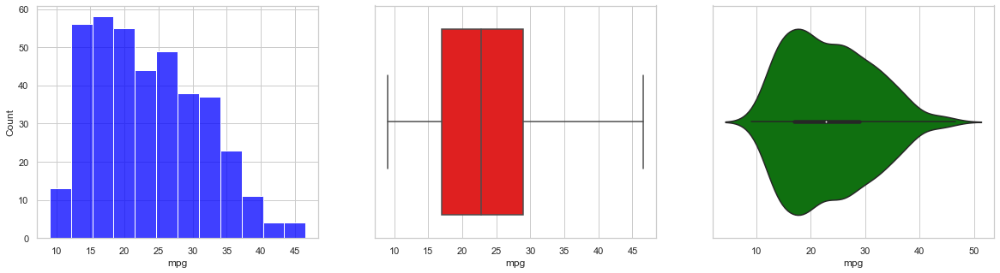

In [21]:
# plotting hist plot, box plot and violin plot for mpg column

uni_num_plot(car_data['mpg'])

Obseravtion : Obseravtion : From above plots we can see that the data is not normally distributed and doesn't have any outliers. There are 165+ observations have the  values between 13-19 and only 6 observations have the values between 40-46.maximum value for the data is 47.

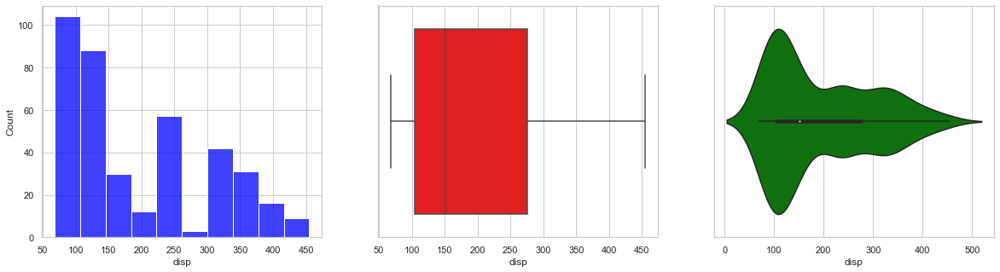

In [22]:
# plotting hist plot, box plot and violin plot for disp column

uni_num_plot(car_data['disp'])

Obseravtion : From above plots we can see that there is not normally distributed in the data and doesn't have any outliers. There are 100+ observation have the  values 50-100 and only a 3 observations have the values between 250-300.maximum value for the data is 450.

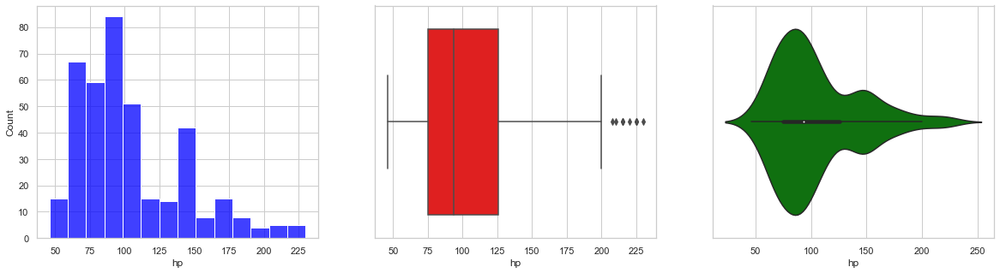

In [23]:
# plotting hist plot, box plot and violin plot for hp column

uni_num_plot(car_data['hp'])

Obseravtion : From above plots we can see that there is no normal distributed in the data and have some outliers above the uperfance. There are 80+ observation have the  values 80-100 and only a 3 observations have the values between 200-210.maximum value for the data is 225.

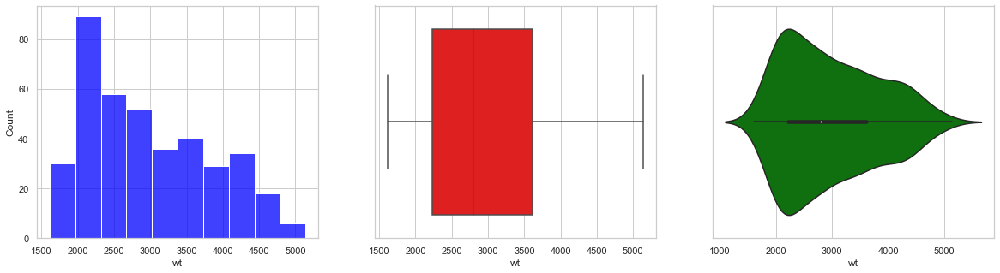

In [24]:
# plotting hist plot, box plot and violin plot for wt column

uni_num_plot(car_data['wt'])

Obseravtion : From above plots we can see that there is no normal distributed in the data and doesn't have outliers. There are 80+ observation have the  values 2000-2500 and only a 5 observations have the value 500.maximum value for the data is 500.

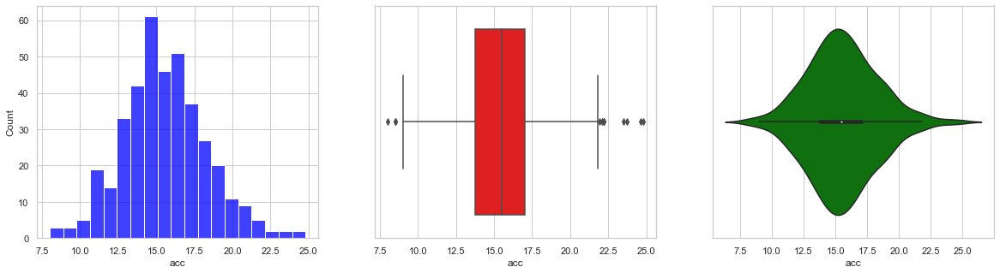

In [25]:
# plotting hist plot, box plot and violin plot for acc column

uni_num_plot(car_data['acc'])

Obseravtion : From above plots we can see that the data is normally distributed and have some outliers above the uperfance and below the lower fance. There are 60+ observations have the  values between 13-15 and only a 3 observations have the values between 24-25.maximum value for the data is 25.0.

#### Univariate Analysis - Categorical

In [26]:
# defining a column to plot pie graph and count plot for Categorical columns
def uni_category_plot(data):
    if data.dtype == 'int64':
        fig, ax = plt.subplots(1,2)
        fig.set_figheight(7)
        fig.set_figwidth(20)

        color=sns.color_palette('bright')
        sns.countplot(data,ax=ax[0],palette='bright')
        data.value_counts().plot.pie(autopct='%1.1f%%',ax=ax[1],shadow=True,colors=color)
        ax[0].set_title(str(data.name)+' Variable Count plot')
        ax[1].set_title(str(data.name)+' Variable Piechart')

In [27]:
# plotting pie graph and count plot for cyl column

uni_category_plot(car_data['cyl'])

Obseravtion : From above plots we can see that 200 observations have the type-4 cylinders and 100 observations have the type-8 cylinders and 85 observations have type-6 cylinders and remaining are the type-3,5 cylinders.
* So, can say that most of the vechiles uses type-4 cylinders.

In [28]:
# plotting pie graph and count plot for year column

uni_category_plot(car_data['yr'])

Obseravtion : From above plots we can see that the year column has 13 different years from 70-82. According to pie graph we can say Every year Averagely 7% of the vechiles are Released. maximum vehicles are in year 73 (40). Minimum vehicles are in year 74(26). 

In [29]:
# plotting pie graph and count plot for origin column

uni_category_plot(car_data['origin'])

Obseravtion : From above plots we can see that the most of the cars from origin-1 i.e., 62.5% cars.remaining cars from origin 2 and 3.

#### Bivariate Analysis
#### Numerical vs Numerical

<AxesSubplot:xlabel='mpg', ylabel='wt'>

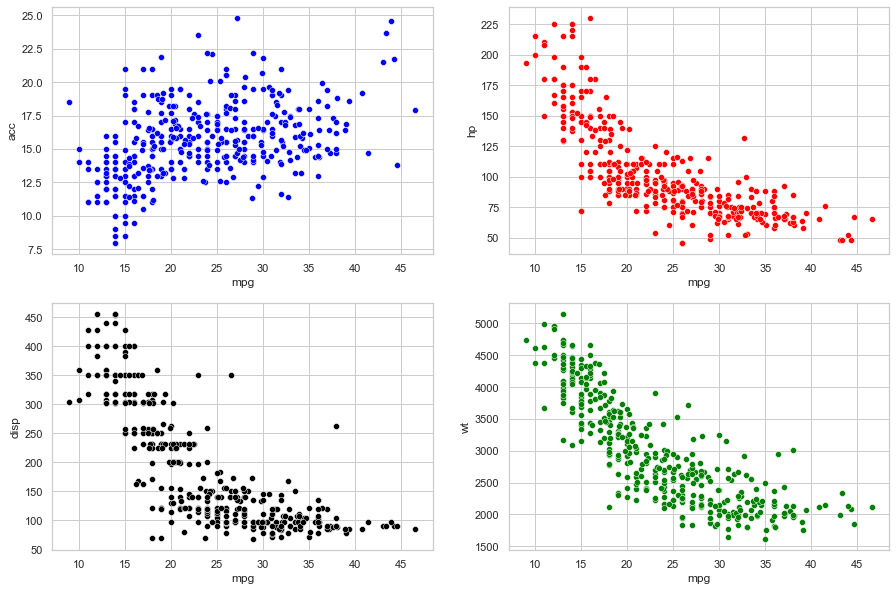

In [30]:
# plot scatter plots for mpg vs numeric columns(acc,wt,hp,disp)
fig,ax=plt.subplots(2,2,figsize=(15,10))
sns.scatterplot(x=car_data['mpg'],y=car_data['acc'],palette='bright',color='blue',ax=ax[0][0])
sns.scatterplot(x=car_data['mpg'],y=car_data['hp'],palette='bright',color='red',ax=ax[0][1])
sns.scatterplot(x=car_data['mpg'],y=car_data['disp'],palette='bright',color='black',ax=ax[1][0])
sns.scatterplot(x=car_data['mpg'],y=car_data['wt'],palette='bright',color='green',ax=ax[1][1])

Observation : From above scatter plots we see that hp,disp,wt columns have Negative correlation with the mpg column and accuracy column have some correlation with mpg column.
From Above Analysis We can say that
* If the Cars have the high weight,horsepower and Displacement then the mpg is low(i.e., Consumption is high).If any of them decreased then mpg will increased.
* If you want vehicle with low consumption fuel then,
1. The car should have less weight
2. displacement should small.
3. horespower should be low.

<AxesSubplot:xlabel='acc', ylabel='disp'>

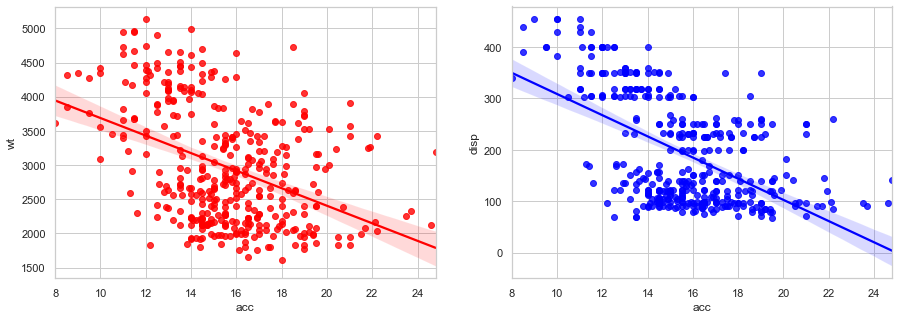

In [31]:
# plot a regression plot for Acceleration vs weight and displacement
fig,ax= plt.subplots(1,2,figsize=(15,5))
sns.regplot(x=car_data['acc'],y=car_data['wt'],color='red',ax=ax[0])
sns.regplot(x=car_data['acc'],y=car_data['disp'],color='blue',ax=ax[1])

Observation : From above plots we can say if you want high speed(i,e.,Acceleration) vehicle then the weight, displacement of the vehicle should low.

###### From Above numerical Bivariate Analysis,
* if you want less consumption vehicle then weight,displacement, horse power of the vehicle should be low.
* Also if you want high speed vehicle then also Weight displacement should be low.
* hp,wt,disp are Equal on Mpg.

In [32]:
# lets add a speed of the car feature for better analysis by combining hp and wt
speed = [0]*len(car_data)
for i in range(0,len(car_data)):
    speed[i] = float("{0:.2f}".format(234*np.cbrt(car_data['hp'][i]/car_data['wt'][i])))

In [33]:
# add speed feature to the data frame
car_data['speed'] = speed
car_data.drop(columns=['hp','wt'],axis=1,inplace=True)

#### Numerical vs Categorical

<AxesSubplot:xlabel='origin', ylabel='mpg'>

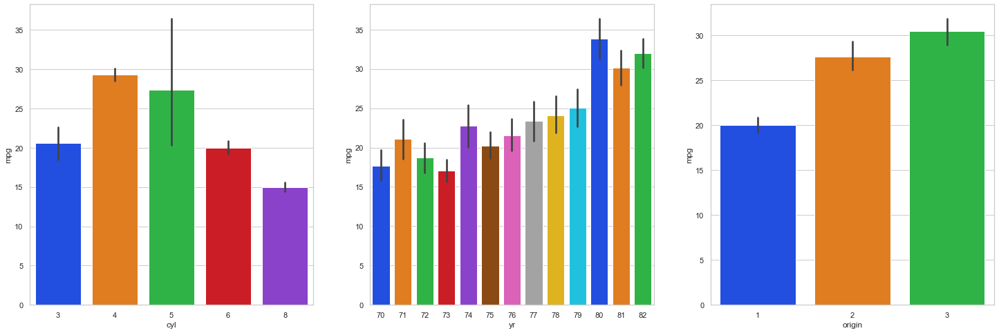

In [34]:
# plot barplot for mpg vs Categorical
fig,ax = plt.subplots(1,3,figsize=(25,8))
sns.barplot(x=car_data['cyl'],y= car_data['mpg'],palette='bright',ax=ax[0])
sns.barplot(x=car_data['yr'],y= car_data['mpg'],palette='bright',ax=ax[1])
sns.barplot(x=car_data['origin'],y= car_data['mpg'],palette='bright',ax=ax[2])

 Observation : From above plots we can see mpg on different categorical variables,
* type-4 cylinders gives the high mpg when compare to other types of cylinders
* 80 yr model cars gives the high mpg and 73 yr model cars gives the low mpg
* From 70-79 yrs the mpg limit was 25 but from 80-82 yrs the mp limit was 30-33.
* cars from origin 3 gives high mpg when compare to other origins.

#### Categorical vs Categorical

<AxesSubplot:xlabel='yr', ylabel='count'>

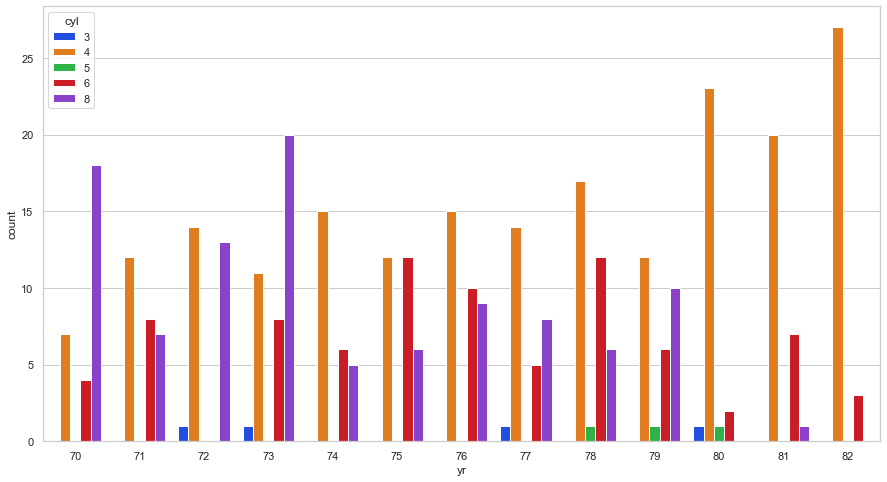

In [35]:
# plot count plot for cyl vs yr
fig = plt.figure(figsize=(15,8))
sns.countplot(x=car_data['yr'],hue=car_data['cyl'],palette='bright')

 Observation : From years 80-82 model cars with type-4 cylinders are more when compared to other types of cylinders. We can see there are only 3 types of cylinders are more i.e., type-4,6,8. there are less no of cars with types 3 and 5. Almost in every year type-4 cylindered vehicles are released.In year 82 only 2 type cylinders are available type-4,6.

<AxesSubplot:xlabel='yr', ylabel='count'>

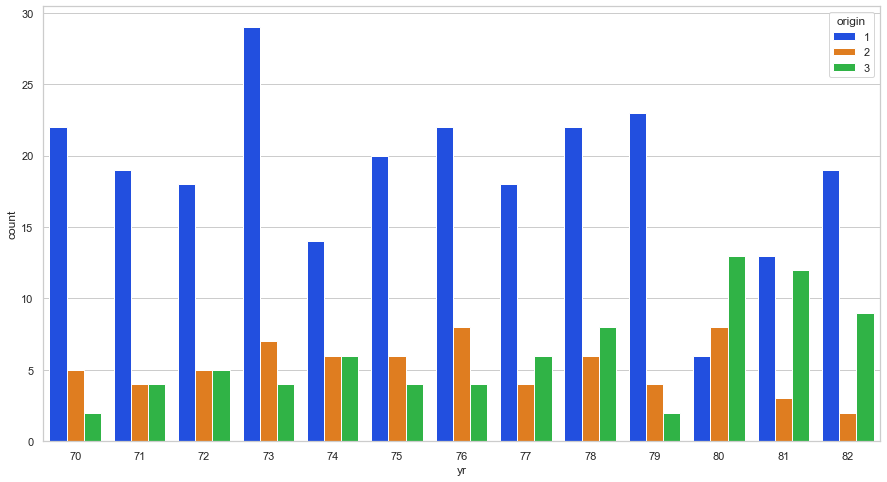

In [36]:
# plot count plot for yr and origin
fig = plt.figure(figsize=(15,8))
sns.countplot(x=car_data['yr'],hue=car_data['origin'],palette='bright')

 Observation : From above plot we can see most of the vehicles from origin 1. in year 73 there are highly 30 observations from origin 1.


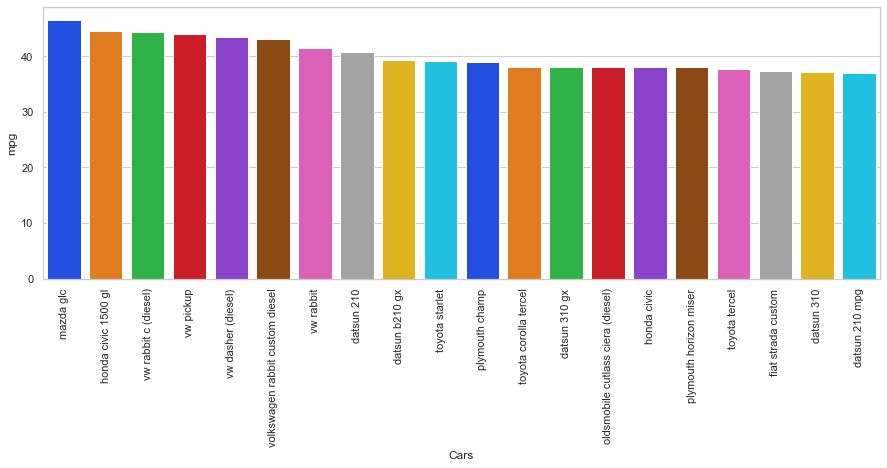

In [37]:
# top 20 cars whose mpg from high to low

fig_dims = (15,5)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(x='car_name',y='mpg',data=car_data.sort_values(by='mpg',ascending=False).head(20),ax=ax,palette='bright');
plt.xlabel('Cars')
plt.xticks(rotation=90)
plt.show()

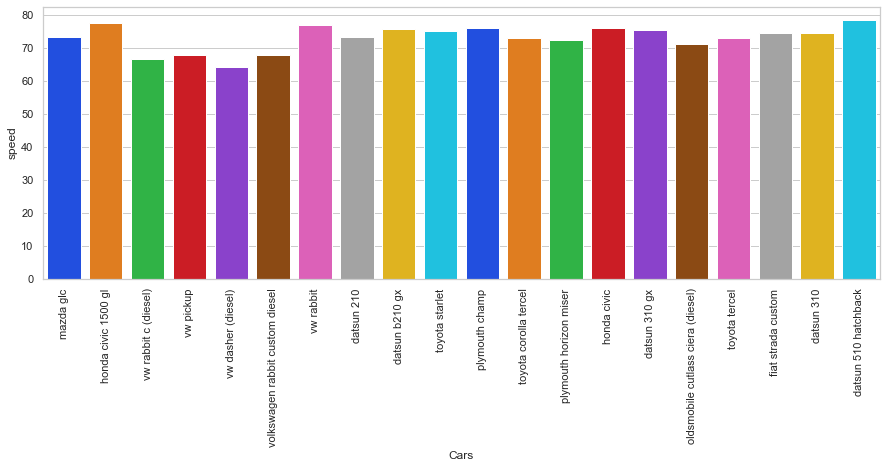

In [38]:
# top 20 cars whose speed from high to low

fig_dims = (15,5)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(x='car_name',y='speed',
            data=car_data.sort_values(by='speed',ascending=False).sort_values(by='mpg',ascending=False).head(20),
            ax=ax,palette='bright');
plt.xlabel('Cars')
plt.xticks(rotation=90)
plt.show()

Observation : From above bar plots we can see the cars which gives high speed based on high mpg,
* If a Customer wants to buy a car then "HONDA CIVIC 1500 gl" will be best because it gives high mpg and good speed.
* If customers wants only high mpg car then "MAZDA  glc" will be best.

#### Multivariate Analysis

<AxesSubplot:>

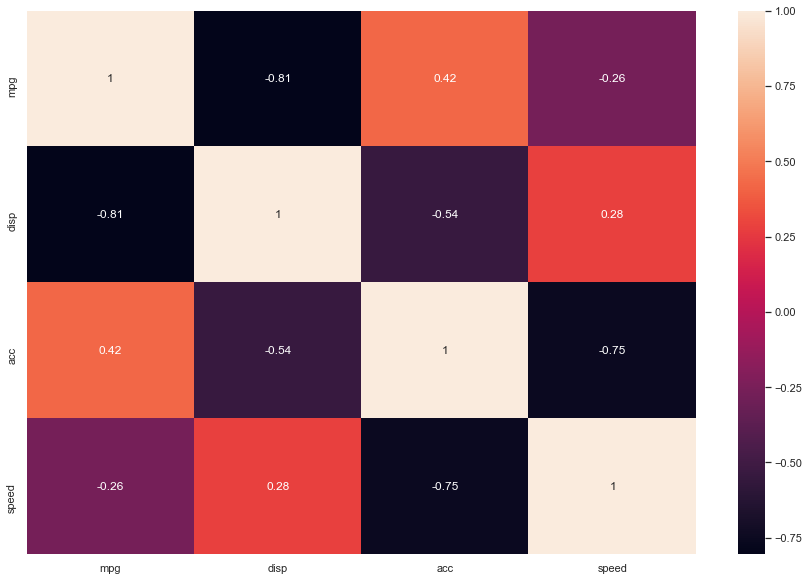

In [39]:
plt.figure(figsize=(15,10))
sns.heatmap(car_data.corr(),annot=True)

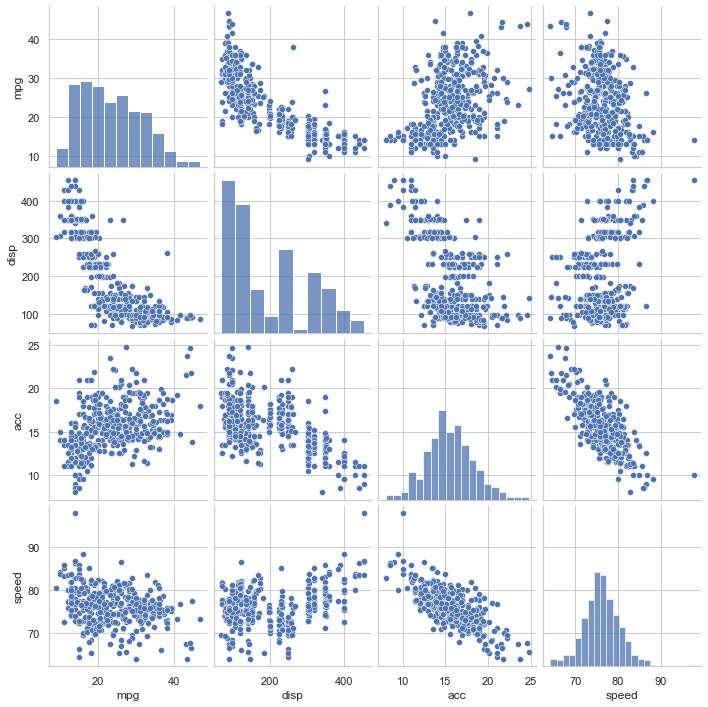

In [40]:
sns.pairplot(car_data,diag_kind='hist')

#### Statistical Analysis

In [41]:
# Describe the data

car_data.describe()

,mpg,disp,acc,speed
count,392.000000,392.000000,392.000000,392.000000
mean,23.445918,194.411990,15.541327,76.182679
std,7.805007,104.644004,2.758864,4.267403
min,9.000000,68.000000,8.000000,64.100000
25%,17.000000,105.000000,13.775000,73.365000
50%,22.750000,151.000000,15.500000,76.020000
75%,29.000000,275.750000,17.025000,78.727500
max,46.600000,455.000000,24.800000,97.760000


In [42]:
# mean of the independent columns for cyl column
car_data.groupby(['cyl']).mean()

# Observation : type-4 cylinders have the max mean of mpg with mean speed of 70.

,mpg,disp,acc,speed
cyl,,,,
3,20.550000,72.500000,13.250000,80.975000
4,29.283920,109.670854,16.581910,75.681709
5,27.366667,145.000000,18.633333,69.733333
6,19.973494,218.361446,16.254217,74.071807
8,14.963107,345.009709,12.955340,78.853301


In [43]:
# mean of the independent columns for yr column
car_data.groupby(['yr']).mean()

# Observation : In yr 80 it has
              # maximum mean mpg
              # minimum mean displacement
              # maximum mean Acceleration
              # mean of speed around 74
# According to above analysis we can say 80 yr model car will be good in all features.

,mpg,disp,acc,speed
yr,,,,
70,17.689655,281.413793,12.948276,81.563103
71,21.111111,213.888889,15.000000,76.876296
72,18.714286,218.375000,15.125000,77.792857
73,17.100000,256.875000,14.312500,78.236500
74,22.769231,170.653846,16.173077,75.064615
75,20.266667,205.533333,16.050000,74.147333
76,21.573529,197.794118,15.941176,74.729706
77,23.375000,191.392857,15.435714,76.481429
78,24.061111,177.805556,15.805556,76.100278


In [44]:
# mean of independent columns for origin column
car_data.groupby(['origin']).mean()

# Observation : best cars will be from origin - 3.

,mpg,disp,acc,speed
origin,,,,
1,20.033469,247.512245,14.990204,76.269837
2,27.602941,109.632353,16.794118,74.995147
3,30.450633,102.708861,16.172152,76.934557


In [45]:
# top 5 cars based on high mpg
car_data.sort_values(by='mpg',ascending=False).car_name.head(5)

320               mazda glc
327     honda civic 1500 gl
323    vw rabbit c (diesel)
388               vw pickup
324      vw dasher (diesel)
Name: car_name, dtype: object

In [46]:
# top 5 cars based on maximum speed
car_data.sort_values(by='speed',ascending=False).car_name.head(5)

13     buick estate wagon (sw)
115         pontiac grand prix
8             pontiac catalina
23                    bmw 2002
6             chevrolet impala
Name: car_name, dtype: object

In [47]:
# top 5 cars based on high acceleration
car_data.sort_values(by='acc',ascending=False).car_name.head(5)

297           peugeot 504
388             vw pickup
324    vw dasher (diesel)
58      volkswagen type 3
193    chevrolet chevette
Name: car_name, dtype: object

In [48]:
# top 5 cars based on low displacement
car_data.sort_values(by='disp',ascending=True).car_name.head(5)

116               fiat 128
331          mazda rx-7 gs
110              maxda rx3
70         mazda rx2 coupe
52     toyota corolla 1200
Name: car_name, dtype: object

#### Hypothesis Testing

Statistical Testing for continuous features with categorical variable.
Here we use two-sample unpaired t-test
* $H_0$: There is no significance difference for Continuous varibales with categorical varibale
* $H_A$: There is a significance difference for Continuous varibales with categorical varibale

In [49]:
# continuous variables list
num_col=list(car_data.select_dtypes(include=['int64','float64']).columns)

for i in num_col:
    group1 = np.array(car_data[car_data.origin == 1][i]) 
    group2 = np.array(car_data[car_data.origin == 2][i])
    group3 = np.array(car_data[car_data.origin == 3][i])
    t, p_value  = f_oneway(group1,group2,group3) 
    print('P_Value:',float(p_value))
    if p_value < 0.05:  # Setting our significance level at 5%
        print("There is significant difference between Three origins for ",i,".So, We reject the null hypothesis\n")
    else:
        print("There is no significant difference between Three origins for ",i,".So, We reject the null hypothesis\n")
    print('\n')

P_Value: 8.673818448010683e-35
There is significant difference between Three origins for  mpg .So, We reject the null hypothesis



P_Value: 2.6282953594501985e-48
There is significant difference between Three origins for  disp .So, We reject the null hypothesis



P_Value: 5.494850233317081e-07
There is significant difference between Three origins for  acc .So, We reject the null hypothesis



P_Value: 0.019649807166415196
There is significant difference between Three origins for  speed .So, We reject the null hypothesis





### 4. Machine learning

In [50]:
# make a duplicate data frame
car_data_dup = car_data

##### k-means Clustering

In [51]:
# Standardize the data

scaled_car_data = car_data.iloc[:,1:]
scaled_car_data = scaled_car_data.apply(zscore)

Text(0.5, 1.0, 'Selecting k with the Elbow Method')

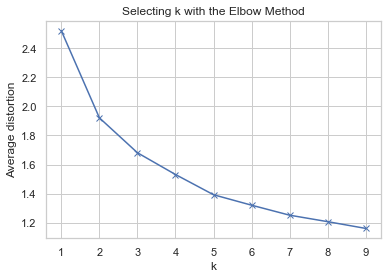

In [52]:
# Using K-Means Clustering to find Optimal no of clusters in the data.
# find the optimal no.of clusters using Elbow method.
clusters = range(1,10)
dist = []
for k in clusters:
    kmc = KMeans(n_clusters=k)
    kmc.fit(scaled_car_data)
    pred = kmc.predict(scaled_car_data)
    dist.append(sum(np.min(cdist(scaled_car_data, kmc.cluster_centers_, 'euclidean'), axis=1)) / scaled_car_data.shape[0])
    
plt.plot(clusters, dist, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')

##### From Above plot We can see Elbow points at 2,3,4,5.So, Lets find silhouette score to find best k value.

In [53]:
# kmeans with k=2 to 6
for i in range(2,6):
    kmc1 = KMeans(n_clusters = i)
    kmc1.fit(scaled_car_data)
    labels = kmc1.labels_
    print('For k=%i : '%i,silhouette_score(scaled_car_data,labels))

For k=2 :  0.35674749169557535
For k=3 :  0.3084607529750037
For k=4 :  0.3006711799830233
For k=5 :  0.32540563119435784


In [54]:
# At k=2 solhouette-score is good.so, lets choose 2 optimal clusters for k means.
kmc = KMeans(n_clusters = 2,random_state=1)
kmc.fit(scaled_car_data)
prediction=kmc.predict(scaled_car_data)

#Append the prediction 
car_data_dup["GROUP"] = prediction
print("Groups Assigned : \n")
car_data_dup.head()

Groups Assigned : 



,car_name,mpg,cyl,disp,acc,yr,origin,speed,GROUP
0,chevrolet chevelle malibu,18.0,8,307.0,12.0,70,1,78.04,1
1,buick skylark 320,15.0,8,350.0,11.5,70,1,83.03,1
2,plymouth satellite,18.0,8,318.0,11.0,70,1,82.39,1
3,amc rebel sst,16.0,8,304.0,12.0,70,1,82.42,1
4,ford torino,17.0,8,302.0,10.5,70,1,80.42,1


In [55]:
# group the clusters
c_group_k = car_data_dup.groupby(by='GROUP')

In [56]:
# mean of the group of clusters
c_group_k.mean()

,mpg,disp,acc,speed
GROUP,,,,
0,27.802033,125.193089,16.621951,75.301260
1,16.106164,311.041096,13.720548,77.667808


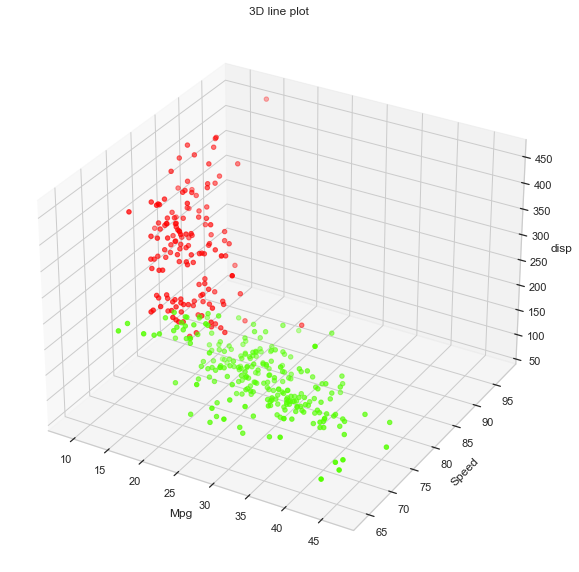

In [57]:
# plot scatter plot for group of the clusters
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot( projection = '3d')
ax.scatter(car_data_dup['mpg'],car_data_dup['speed'], car_data_dup['disp'],c=car_data_dup['GROUP'],cmap='prism_r')
ax.set_title('3D line plot')
ax.set_xlabel("Mpg")
ax.set_ylabel("Speed")
ax.set_zlabel("disp")
plt.show()

#### Observation:
1. vehicle gives high millage and good speed.so, fuel consumption is low
2. Another group vechicles have low milage and good speed.so, fuel consumption is high.
##### Group 0: Low Fuel Consumption Cars
##### Group 1: High Fuel Consumption Cars

##### Hierarchical Clustering

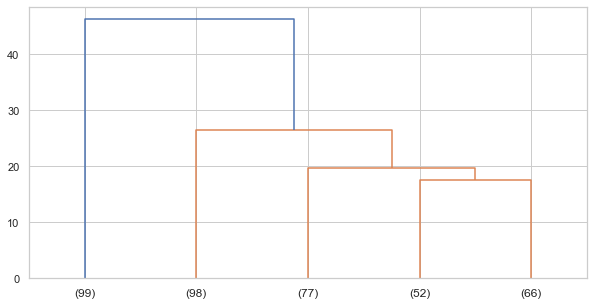

In [58]:
#plotting dendogram
plt.figure(figsize=(10, 5))
dend=dendrogram(linkage(scaled_car_data,metric='euclidean',method='ward'),p=5,truncate_mode='lastp')

In [59]:
# find the cephenetic correlation
Z = linkage(scaled_car_data, metric='euclidean', method='ward')
C, coph_dists = cophenet(Z , pdist(scaled_car_data))

C

0.6652536789960386

In [60]:
# classify the clusters
clusters = fcluster(Z, 30, criterion='distance')
clusters

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 1, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1,
       2, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 1,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1,
       1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,

In [61]:
# group the clusters
car_data_dup['GROUP'] = clusters
c_group_h = car_data_dup.groupby(by='GROUP')
c_group_h.mean()

,mpg,disp,acc,speed
GROUP,,,,
1,14.653535,346.626263,12.694949,79.156263
2,26.416724,142.981229,16.503072,75.177952


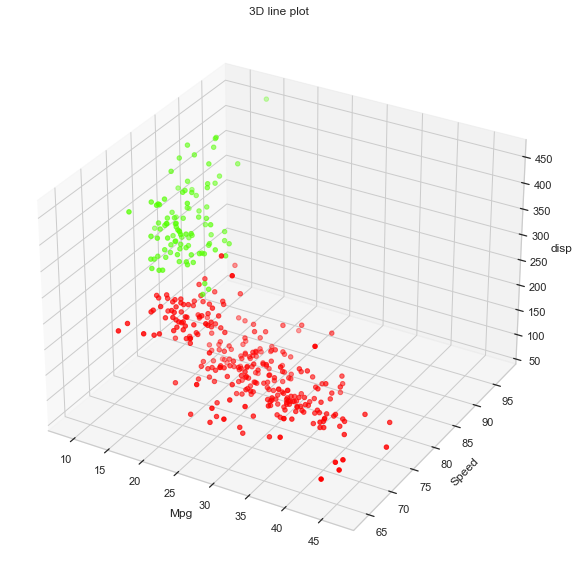

In [62]:
# plot scatter plot for group of the clusters
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot( projection = '3d')
ax.scatter(car_data_dup['mpg'],car_data_dup['speed'], car_data_dup['disp'],c=car_data_dup['GROUP'],cmap='prism_r')
ax.set_title('3D line plot')
ax.set_xlabel("Mpg")
ax.set_ylabel("Speed")
ax.set_zlabel("disp")
plt.show()

##### Observation :

* Both Types of clusters are have similar results, But in Kmeans Clustering Finding the k value will be the challenging.
* In Hierarchical Clustering we can use different linkage methods and metric methods,Butin k-means Most of the cases Euclidean distance will be better.
* In 3D plots of two methods we can see In k-means two groups are in different range but in same range two groups are in onw range, But in hierarchical clustering, two groups are in different ranges.

### 5. Answer below questions based on outcomes of using ML based methods.

#####  # Mention how many optimal clusters are present in the data and what could be the possible reason behind it.
* We have 2 clusters present in the data.
* One Cluster is cars which consumes less fuel.
* Another Cluster is cars Which consumes high fuel.
* Reason is that in our data we have different features which tells us the Fuel consumption.So, If we want to take a cars from the Market We havee to choose which consumes low fuel and give high speed and have good displacement.
* So, According to that We have two clusters based on the we can choose abest car which consumes less fuel.Beacuse, now a days fuel is going very Expensive so that most of the customers wants the cars which consumes less fuel. 

#### # Use linear regression model on different clusters separately and print the coefficients of the models individually

In [63]:
# intialize the model
lr = LinearRegression()

In [64]:
# top 10 rows of clustered dataset
car_data_dup.head(10)

,car_name,mpg,cyl,disp,acc,yr,origin,speed,GROUP
0,chevrolet chevelle malibu,18.0,8,307.0,12.0,70,1,78.04,1
1,buick skylark 320,15.0,8,350.0,11.5,70,1,83.03,1
2,plymouth satellite,18.0,8,318.0,11.0,70,1,82.39,1
3,amc rebel sst,16.0,8,304.0,12.0,70,1,82.42,1
4,ford torino,17.0,8,302.0,10.5,70,1,80.42,1
5,ford galaxie 500,15.0,8,429.0,10.0,70,1,83.61,1
6,chevrolet impala,14.0,8,454.0,9.0,70,1,86.51,1
7,plymouth fury iii,14.0,8,440.0,8.5,70,1,86.13,1
8,pontiac catalina,14.0,8,455.0,10.0,70,1,86.69,1
9,amc ambassador dpl,15.0,8,390.0,8.5,70,1,85.83,1


In [65]:
# check for dtypes
car_data_dup.dtypes

car_name      object
mpg          float64
cyl         category
disp         float64
acc          float64
yr          category
origin      category
speed        float64
GROUP          int32
dtype: object

In [66]:
# Split the data based on group
group_1= car_data_dup[car_data_dup['GROUP']==1]
group_2 = car_data_dup[car_data_dup['GROUP']==2]

In [67]:
# Apply Linear regression on Group1

# split the data
X_1 = group_1.drop(['car_name','mpg','GROUP'],axis=1)
y_1 = group_1['mpg']

# perform train-test-split
X_train_1,X_test_1,y_train_1,y_test_1 = train_test_split(X_1,y_1,test_size=0.2,random_state=1)

# call the linear model
lr.fit(X_train_1,y_train_1)

# print Accuracies
print('Train Accuracy : ',lr.score(X_train_1,y_train_1))
print("Test Accuracy : ",lr.score(X_test_1,y_test_1))

# make coefficient dataframe
coeff_df_1 = pd.DataFrame(lr.coef_,X_train_1.columns,columns=['Coefficient'])
coeff_df_1

Train Accuracy :  0.45784650526080295
Test Accuracy :  0.7985332380756909


,Coefficient
cyl,0.000000
disp,-0.024165
acc,-0.673448
yr,0.444601
origin,0.000000
speed,-0.023708


In [68]:
# Apply Linear regression on Group2

# split the data
X_2 = group_2.drop(['car_name','mpg','GROUP'],axis=1)
y_2 = group_2['mpg']

# perform train-test-split
X_train_2,X_test_2,y_train_2,y_test_2 = train_test_split(X_2,y_2,test_size=0.2,random_state=1)

# call linear model
lr.fit(X_train_2,y_train_2)

# print accuracies
print('Train Accuracy : ',lr.score(X_train_2,y_train_2))
print("Test Accuracy : ",lr.score(X_test_2,y_test_2))

# make coefficient dataframe
coeff_df_2 = pd.DataFrame(lr.coef_,X_train_2.columns,columns=['Coefficient'])
coeff_df_2

Train Accuracy :  0.6842206535775489
Test Accuracy :  0.530778942894452


,Coefficient
cyl,1.748539
disp,-0.099263
acc,-0.009671
yr,0.756401
origin,0.472783
speed,-0.222248


In [69]:
# Apply Linear regression on whole data

# split the data
X = car_data_dup.drop(['car_name','mpg','GROUP'],axis=1)
y = car_data_dup['mpg']

# perform train-test-split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=1)

# call linear model
lr.fit(X_train,y_train)

# print Accuracies
print('Train Accuracy : ',lr.score(X_train,y_train))
print("Test Accuracy : ",lr.score(X_test,y_test))

# make coeff dataframe
coeff_df = pd.DataFrame(lr.coef_,X.columns,columns=['Coefficient'])
coeff_df

Train Accuracy :  0.7496405789921194
Test Accuracy :  0.7622996357190659


,Coefficient
cyl,-0.296203
disp,-0.042011
acc,-0.122487
yr,0.645549
origin,1.331682
speed,-0.095654


#### Observation : 
* When we perform linear regression on different groups individually the performance is decreased due to shortened of the data.
* when we perform Linear regression on whole data we have seen better performance than the indiviudal groups performance.so, whenever We are splitting the data the performance will decreased.
* When data is small, performance will be Absolutely low and the varaince will be increased when we decrease the data.
* In group2 we have less no of rows, when we perform linear model on the data the variance is too high and the performance is very low. 

### 6. Improvisation

1. Collecting more data will be Useful for better Analysis.
2. Adding the Attribute called Avg speed will be good for Analysis.
3. Try to avoid null values Even single null value may effect the performance.
4. Adding column called rating( multi-valued) amy be effect the Analysis for Customers.

## --------------------------------------------------------------------------------------------------------------------------------------

# PART-2

### DOMAIN: 
Manufacturing 
### CONTEXT: 
Company X curates and packages wine across various vineyards spread throughout the country.
### DATA DESCRIPTION: 
The data concerns the chemical composition of the wine and its respective quality.
Attribute Information: 
1. A, B, C, D: specific chemical composition measure of the wine
2. Quality: quality of wine [ Low and High ]

In [70]:
# import the dataset

wine_data = pd.read_excel('Part2 - Company.xlsx')

In [71]:
# top 5 rows in the data

wine_data.head()

,A,B,C,D,Quality
0,47,27,45,108,Quality A
1,174,133,134,166,Quality B
2,159,163,135,131,NaN
3,61,23,3,44,Quality A
4,59,60,9,68,Quality A


In [72]:
# shape of the data
wine_data.shape

(61, 5)

In [73]:
# columns of the data
wine_data.columns

Index(['A', 'B', 'C', 'D', 'Quality'], dtype='object')

In [74]:
# check for null values
wine_data.isna().sum()

A           0
B           0
C           0
D           0
Quality    18
dtype: int64

In [75]:
# drop the null values and make duplicate dataset
wine_data_dup = wine_data.drop('Quality',axis=1)

In [76]:
# shape of the data for duplicate dataset
wine_data_dup.shape

(61, 4)

In [77]:
# info of the data
wine_data_dup.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61 entries, 0 to 60
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   A       61 non-null     int64
 1   B       61 non-null     int64
 2   C       61 non-null     int64
 3   D       61 non-null     int64
dtypes: int64(4)
memory usage: 2.0 KB


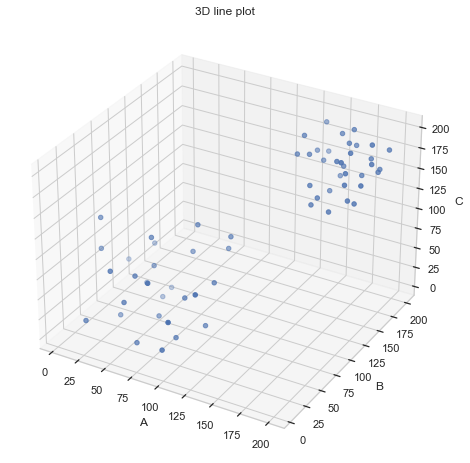

In [78]:
# plot scatter plot for group of the clusters
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot( projection = '3d')
ax.scatter(wine_data_dup['A'],wine_data_dup['B'],wine_data_dup['C'],cmap='prism_r')
ax.set_title('3D line plot')
ax.set_xlabel("A")
ax.set_ylabel("B")
ax.set_zlabel("C")
plt.show()

In [79]:
# applying k-means clustering to the data
# taking k=2 because we have 2 groups
kmc1 = KMeans(n_clusters = 2,random_state=1)
kmc1.fit(wine_data_dup)
prediction1=kmc1.predict(wine_data_dup)

#Append the prediction 
wine_data_dup['Quality'] = prediction1
print("Groups Assigned : \n")
wine_data_dup.head()

Groups Assigned : 



,A,B,C,D,Quality
0,47,27,45,108,1
1,174,133,134,166,0
2,159,163,135,131,0
3,61,23,3,44,1
4,59,60,9,68,1


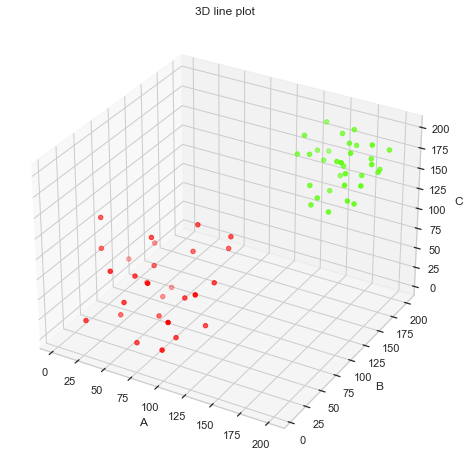

In [80]:
# plot scatter plot for group of the clusters
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot( projection = '3d')
ax.scatter(wine_data_dup['A'],wine_data_dup['B'],wine_data_dup['C'],c=wine_data_dup['Quality'],cmap='prism_r')
ax.set_title('3D line plot')
ax.set_xlabel("A")
ax.set_ylabel("B")
ax.set_zlabel("C")
plt.show()

In [81]:
# compare original target and clusters
pd.DataFrame(data=[wine_data['Quality'],wine_data_dup['Quality']]).T.dropna().head(10)

,Quality,Quality
0,Quality A,1
1,Quality B,0
3,Quality A,1
4,Quality A,1
6,Quality A,1
8,Quality B,0
10,Quality A,1
11,Quality B,0
12,Quality A,1
13,Quality A,1


#### Observation : We can see that both the columns follow similar pattern. so, place the Clusters in missing values of target variable.

In [82]:
# fill clusters in null values
for i in range(0,len(wine_data)):
    if wine_data_dup['Quality'][i]==1:
        wine_data['Quality'][i] = 'Quality A'
    elif wine_data_dup['Quality'][i]==0:
        wine_data['Quality'][i] = 'Quality B'

In [83]:
# select top 10 rows
wine_data.head(10)

,A,B,C,D,Quality
0,47,27,45,108,Quality A
1,174,133,134,166,Quality B
2,159,163,135,131,Quality B
3,61,23,3,44,Quality A
4,59,60,9,68,Quality A
5,153,140,154,199,Quality B
6,34,28,78,22,Quality A
7,191,144,143,154,Quality B
8,160,181,194,178,Quality B
9,145,178,158,141,Quality B


## --------------------------------------------------------------------------------------------------------------------------------------

# PART-3

### DOMAIN: 
Automobile 
### CONTEXT: 
The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette. 
The vehicle may be viewed from one of many different angles.
### DATA DESCRIPTION: 
The data contains features extracted from the silhouette of vehicles in different angles. Four "Corgie" model vehicles 
were used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of 
vehicles was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more 
difficult to distinguish between the cars.
* All the features are numeric i.e. geometric features extracted from the silhouette.

### 1. Data WareHouse, cleansing, Pre-processing

In [84]:
# import data

data = pd.read_csv('Part3 - vehicle.csv')

In [85]:
# top 5 rows of the data
data.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [86]:
# shape of the data
data.shape

# we have 846 rows and 19 columns

(846, 19)

In [87]:
# check for columns
data.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')

In [88]:
# check for null values
data.isna().sum()

# Observation : we have null values in some of the columns.so, drop them.

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [89]:
# drop the null values
data.dropna(inplace=True)

In [90]:
# check for info
data.info()

# observation : After drop null values we have 813 rows(i.e., 33 rows were dropeed )

<class 'pandas.core.frame.DataFrame'>
Int64Index: 813 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  813 non-null    int64  
 1   circularity                  813 non-null    float64
 2   distance_circularity         813 non-null    float64
 3   radius_ratio                 813 non-null    float64
 4   pr.axis_aspect_ratio         813 non-null    float64
 5   max.length_aspect_ratio      813 non-null    int64  
 6   scatter_ratio                813 non-null    float64
 7   elongatedness                813 non-null    float64
 8   pr.axis_rectangularity       813 non-null    float64
 9   max.length_rectangularity    813 non-null    int64  
 10  scaled_variance              813 non-null    float64
 11  scaled_variance.1            813 non-null    float64
 12  scaled_radius_of_gyration    813 non-null    float64
 13  scaled_radius_of_gyr

In [91]:
# from above info class is of object type
# check for value_counts

data['class'].value_counts()

car    413
bus    205
van    195
Name: class, dtype: int64

In [92]:
# convert object type of class variable to category
data['class'] = data['class'].astype('category')

In [93]:
# check for mean values of different columns for different classes
data.groupby('class').mean()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
class,,,,,,,,,,,,,,,,,,
bus,91.478049,44.892683,76.482927,166.585366,63.800000,7.034146,169.073171,40.243902,20.482927,146.258537,192.039024,443.443902,179.648780,76.873171,4.731707,10.385366,188.053659,191.648780
car,96.244552,46.079903,89.031477,180.832930,61.021792,8.847458,181.184019,38.038741,21.539952,150.024213,198.118644,502.530266,179.738499,69.953995,7.133172,15.225182,189.486683,197.607748
van,90.466667,42.005128,73.087179,146.887179,61.241026,9.717949,141.297436,48.020513,18.558974,145.092308,163.897436,297.200000,156.958974,72.876923,6.400000,9.733333,188.876923,196.041026


### 2. Visualization

#### Univariate Analysis - Numerical

In [94]:
# define a function to plot hist plot, box plot and violin plot for numerical columns.

def uni_num_plot(data):
    if data.dtype == 'int64' or 'float64':
        fig,ax = plt.subplots(1,3,figsize = (20,5))
        sns.histplot(data,color='blue',ax=ax[0])
        sns.boxplot(data,color='red',ax=ax[1])
        sns.violinplot(data,color='green',ax=ax[2])
        ax[0].set_title(data.name)

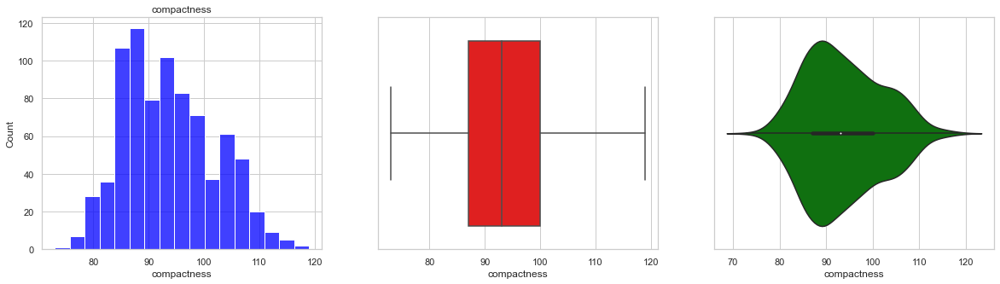

In [95]:
# plotting hist plot, box plot and violin plot for compactness column
uni_num_plot(data['compactness'])

Observation : From above plots we can see that the Compactness data doesnot have any outliers, data is partially normally distributed and 50% data have the Compactness value between 85-100.

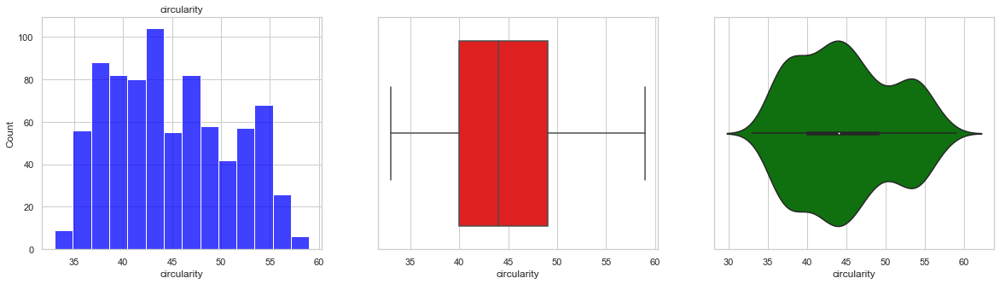

In [96]:
# plotting hist plot, box plot and violin plot for circularity column
uni_num_plot(data['circularity'])

Observation : From above plots we can see that the Circularity data doesnot have any outliers, data is abnormal distribution and 50% data have the Circularity value between 40-50. 

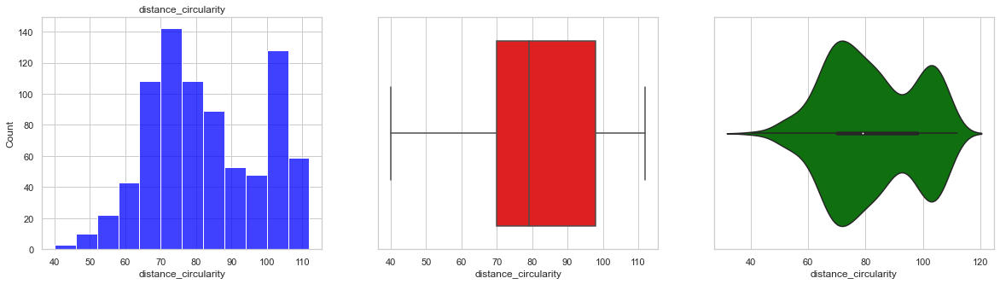

In [97]:
# plotting hist plot, box plot and violin plot for distance-circularity column
uni_num_plot(data['distance_circularity'])

Observation : From above plots we can see that Distance circularity data doesnot have any outliers, data is abnormally distribution and data is right skewed and 50% data have the Distance-circularity value between 70-100.

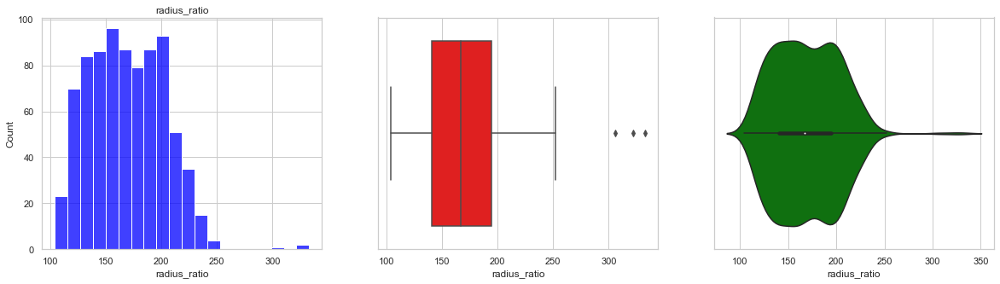

In [98]:
# plotting hist plot, box plot and violin plot for Radius ratio column
uni_num_plot(data['radius_ratio'])

Observation : From above plots we can see that the radius-ratio data have 3 outliers, data is left skewed distribution and 50% data have the Radius-ratio value between 100-250.

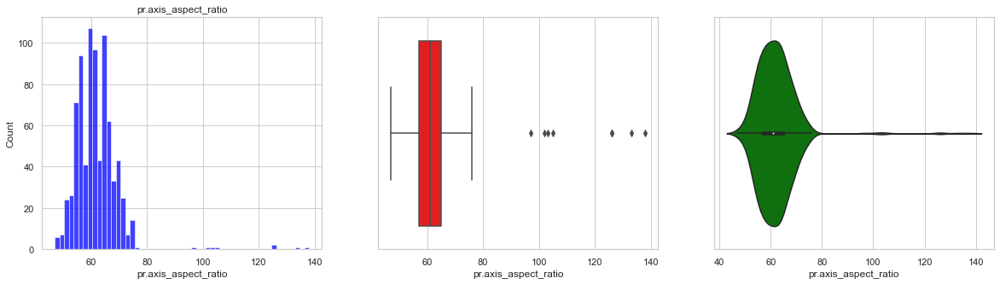

In [99]:
# plotting hist plot, box plot and violin plot for pr.axis_aspect_ratio column
uni_num_plot(data['pr.axis_aspect_ratio'])

Observation : From above plots we can see that the pr.axis_aspect_ratio data have some outliers, data is left skewed distribution and 50% data have the pr.axis_aspect_ratio value between 55-65.

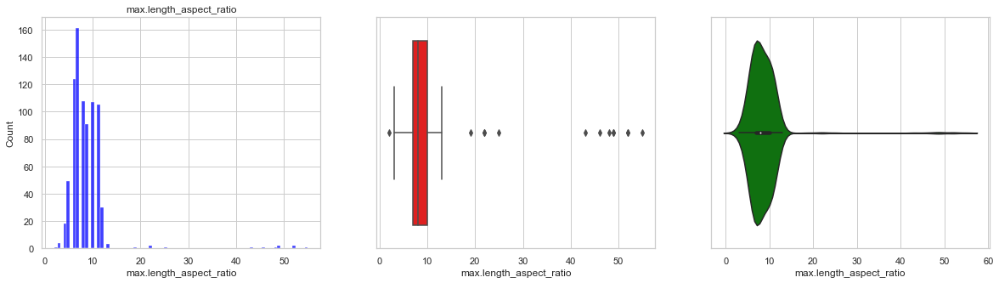

In [100]:
# plotting hist plot, box plot and violin plot for max.length_aspect_ratio column
uni_num_plot(data['max.length_aspect_ratio'])

Observation : From above plots we can see that the max.length_aspect_ratio data have some outliers, data is left skewed distribution and 50% data have the max.length_aspect_ratio value between 5-10.

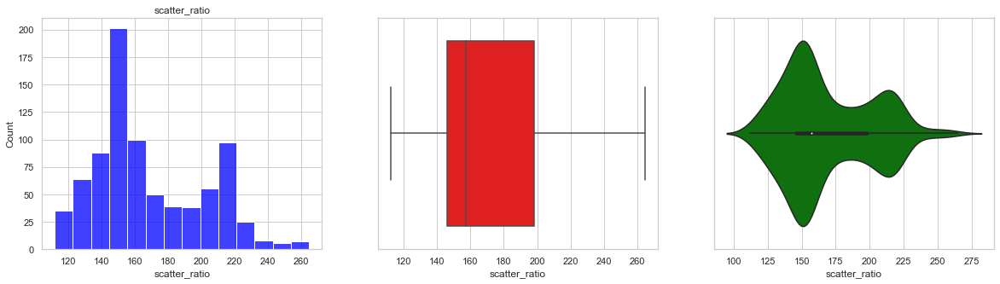

In [101]:
# plotting hist plot, box plot and violin plot for scatter_ratio column
uni_num_plot(data['scatter_ratio'])

Observation : From above plots we can see that the scatter_ratio data doesn't have outliers, data has abnormal distribution and 50% data have the scatter_ratio value between 145-200.

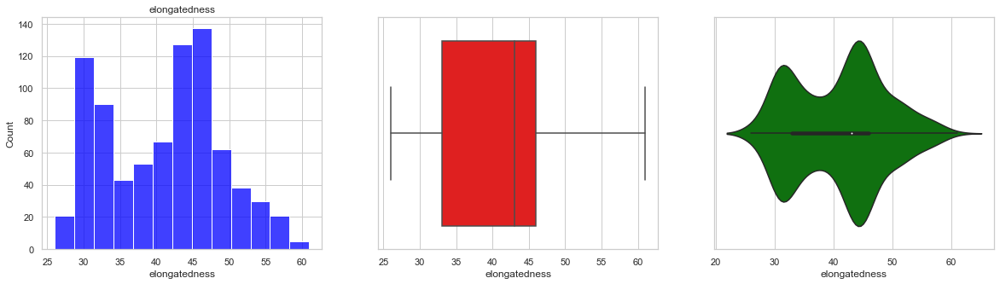

In [102]:
# plotting hist plot, box plot and violin plot for elongatedness column
uni_num_plot(data['elongatedness'])

Observation : From above plots we can see that the elongatedness data doesn't have outliers, data has abnormal distribution and 50% data have the elongatedness value between 33-46.

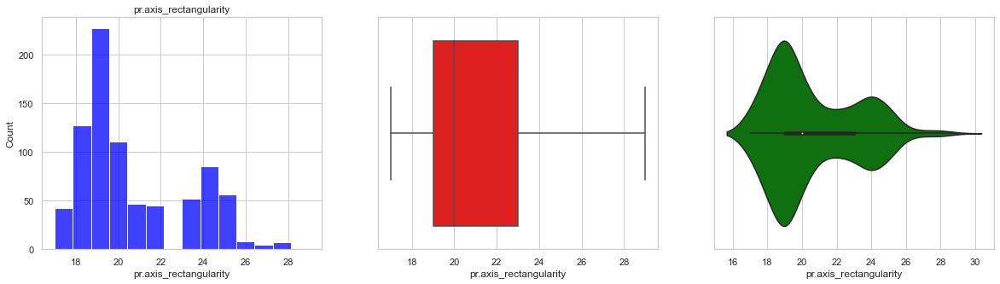

In [103]:
# plotting hist plot, box plot and violin plot for pr.axis_rectangularity column
uni_num_plot(data['pr.axis_rectangularity'])

Observation : From above plots we can see that the pr.axis_rectangularity data doesn't have outliers, data has abnormal distribution and 50% data have the pr.axis_rectangularity value between 19-23.

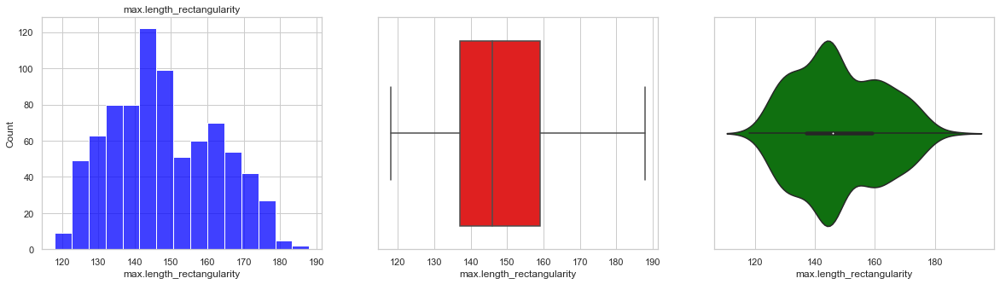

In [104]:
# plotting hist plot, box plot and violin plot for max.length_rectangularity column
uni_num_plot(data['max.length_rectangularity'])

Observation : From above plots we can see that the max.length_aspect_ratio data doesn't have outliers, data has abnormal distribution and 50% data have the max.length_aspect_ratio value between 135-160.

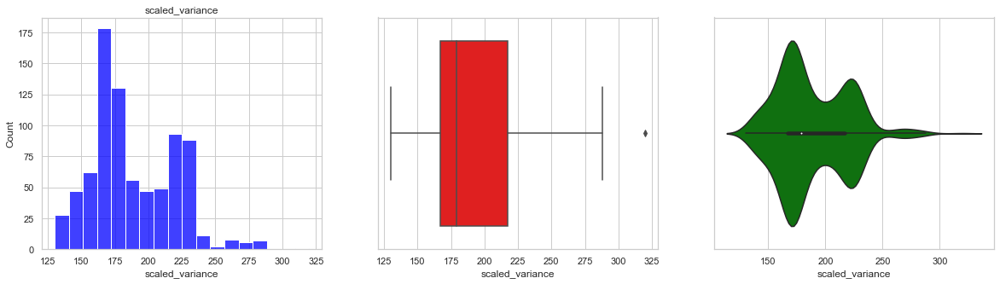

In [105]:
# plotting hist plot, box plot and violin plot for scaled_variance column
uni_num_plot(data['scaled_variance'])

Observation : From above plots we can see that the scaled_variance data have 1 outlier, data has abnormal distribution and 50% data have the scaled_variance value between 165-220.

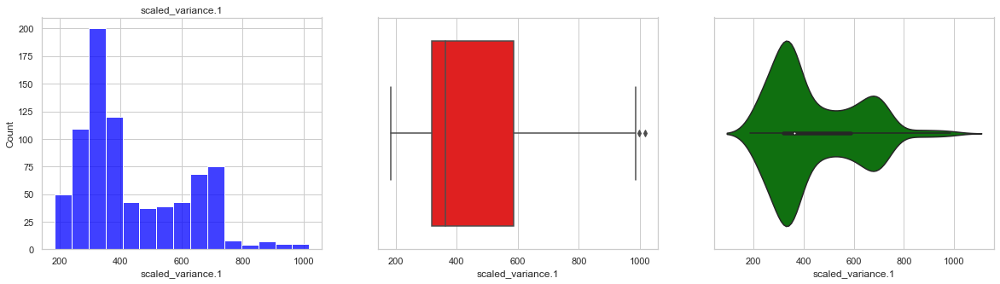

In [106]:
# plotting hist plot, box plot and violin plot for scaled_variance.1 column
uni_num_plot(data['scaled_variance.1'])

Observation : From above plots we can see that the scaled_variance.1 data have 2 outliers, data has abnormal distribution and 50% data have the scaled_variance.1 value between 300-600.

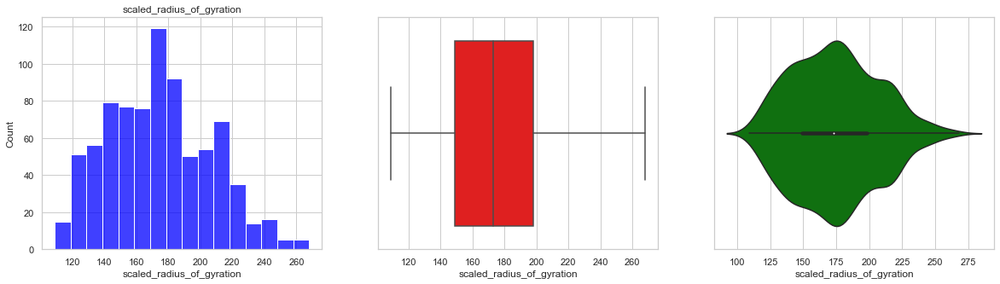

In [107]:
# plotting hist plot, box plot and violin plot for scaled_radius_of_gyration column
uni_num_plot(data['scaled_radius_of_gyration'])

Observation : From above plots we can see that the scaled_radius_of_gyration data doesnot have outliers, data has partial normal distribution and 50% data have the scaled_radius_of_gyration value between 150-200.

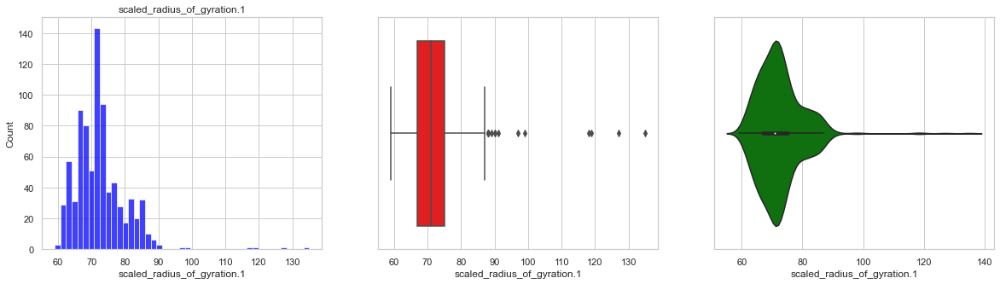

In [108]:
# plotting hist plot, box plot and violin plot for scaled_radius_of_gyration.1 column
uni_num_plot(data['scaled_radius_of_gyration.1'])

Observation : From above plots we can see that the scaled_radius_of_gyration.1 data have some outliers, data has left skewed distribution and 50% data have the scaled_radius_of_gyration.1 value between 65-75.

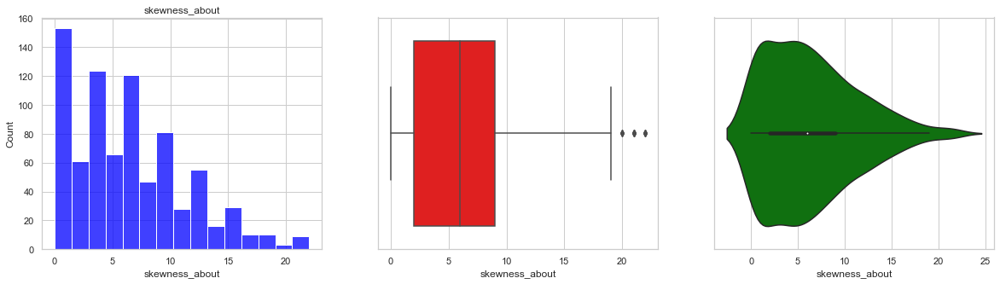

In [109]:
# plotting hist plot, box plot and violin plot for skewness_about column
uni_num_plot(data['skewness_about'])

Observation : From above plots we can see that the skewness_about data have 3 outliers, data has left skewed distribution and 50% data have the skewness_about value between 2-9.

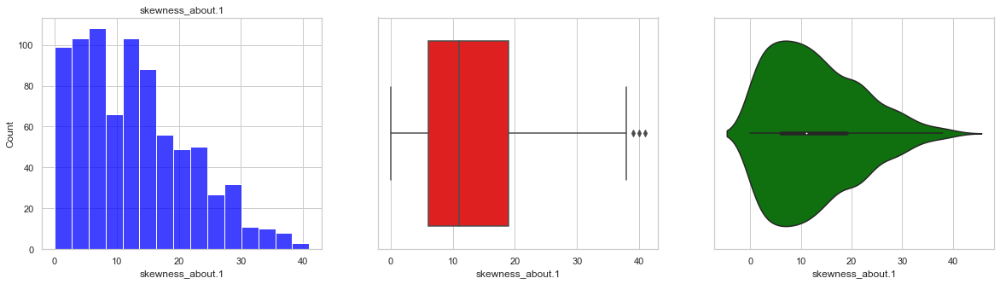

In [110]:
# plotting hist plot, box plot and violin plot for skewness_about.1 column
uni_num_plot(data['skewness_about.1'])

Observation : From above plots we can see that the skewness_about.1 data have 3 outliers, data has left skewed normal distribution and 50% data have the skewness_about.1 value between 5-20.

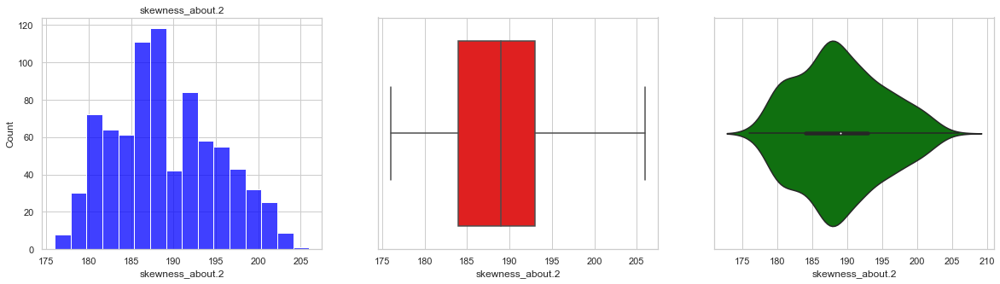

In [111]:
# plotting hist plot, box plot and violin plot for skewness_about.2 column
uni_num_plot(data['skewness_about.2'])

Observation : From above plots we can see that the skewness_about.2 data have 3 outliers, data is partially normal distributed and 50% data have the skewness_about.2 value between 183-193.

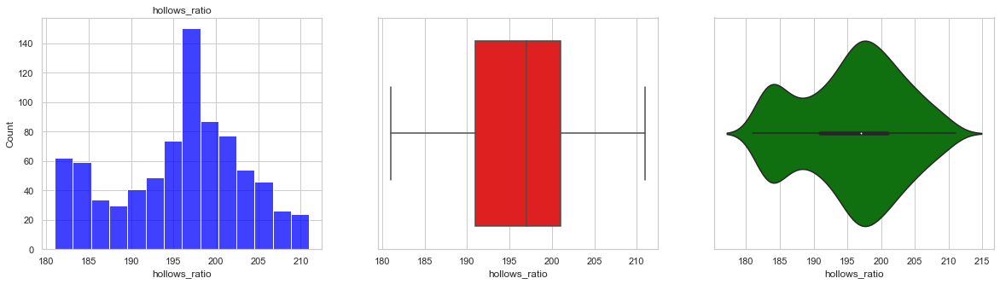

In [112]:
# plotting hist plot, box plot and violin plot for hollows_ratio column
uni_num_plot(data['hollows_ratio'])

Observation : From above plots we can see that the hollows_ratio data doesnot have outliers, data is abnormal distributed and 50% data have the hollows_ratio value between 191-201.

#### Univariate Analysis - Categorical

<AxesSubplot:ylabel='class'>

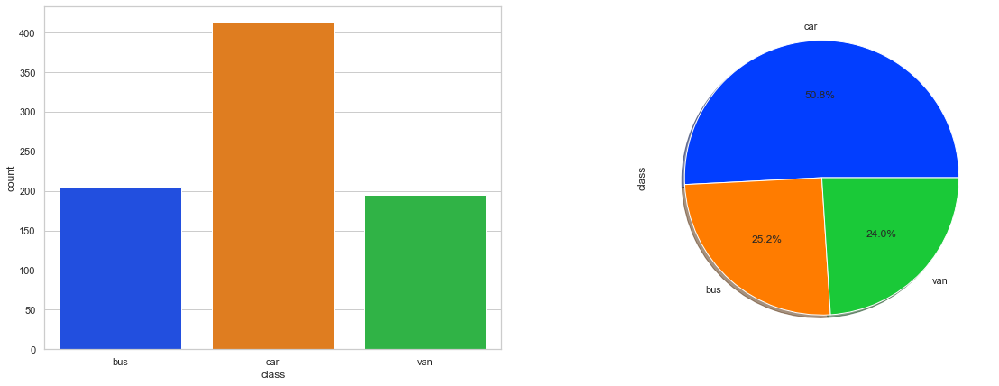

In [113]:
# plotting Countplot and pie graph for Class column

fig,ax = plt.subplots(1,2,figsize=(20,7))

color = sns.color_palette('bright')
sns.countplot(data['class'],ax=ax[0],palette=color)
data['class'].value_counts().plot.pie(autopct = "%1.1f%%",shadow = True, ax=ax[1],colors = color)

Observation : From above plots we can see that in our vehicles data there are 51% of Cars, 25% of buses and 24% of Vans.So, If we train model then the cars will be classified better than other vehicles because cars are the majority.

#### Bivariate Analysis - Numerical vs Categorical

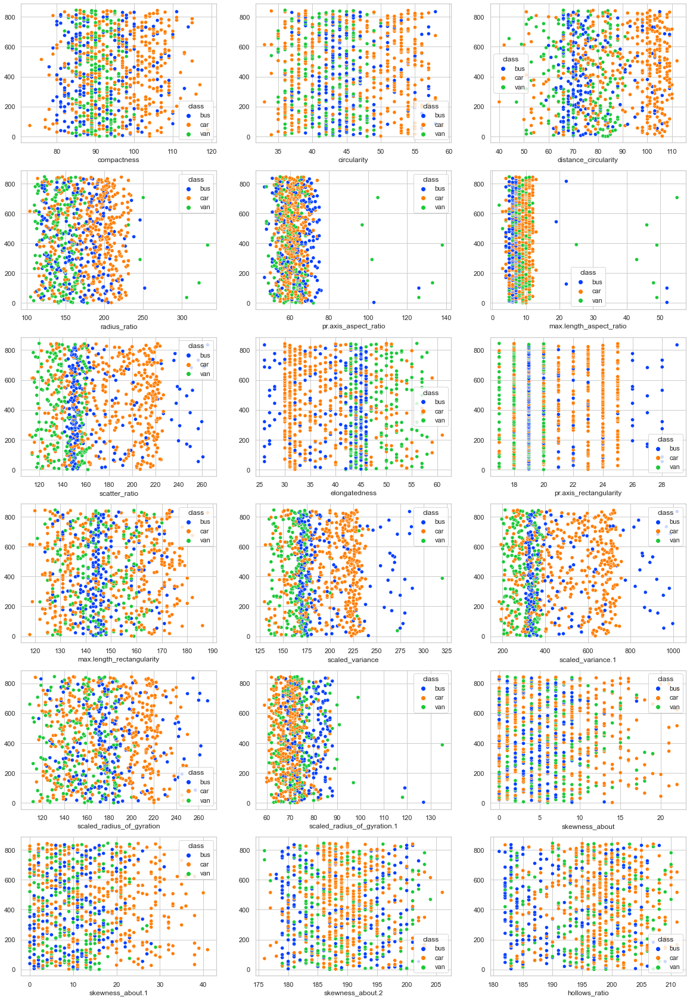

In [114]:
num_columns = data.columns.drop('class')

# find subplots and Plotting numerical columns
if len(num_columns) > 0:
    plotx = 0
    ploty = 0
    for i in range(1,4):
        if len(num_columns)%i == 0:
            ploty = i
            plotx = int(len(num_columns)/i)
            
    # Plotting scatter plots for numerical columns along with class
    fig,ax = plt.subplots(plotx,ploty,figsize=(20,30))
    k=0
    for i in range(plotx):
        for j in range(ploty):
            sns.scatterplot(x=data[num_columns[k]],y=data.index, hue=data['class'], ax=ax[i][j],palette='bright')
            k = k+1

Observation : We can see from above plots there are no different range of values for different vehicles we cannot see any difference between the values. 

#### Bivariate Analysis - Numerical vs Numerical

<AxesSubplot:xlabel='compactness', ylabel='radius_ratio'>

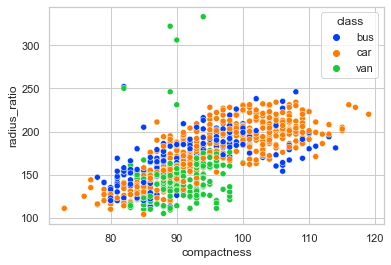

In [115]:
# plotting scatter plot for circularity vs radius ratio

sns.scatterplot(x=data['compactness'],y=data['radius_ratio'],hue=data['class'],palette='bright')

 Observation : from above plot we can see that if compactness value is > 100 then it should be car or bus because, there are vans with compactness value >100 and buses also very less.so, may be if >100 compactness are the vehicles are Cars.If radius-ratio >250 then it is van beacuse we can see 4 pointsabove the 250 of radius-ratio.

#### Multivariate Anlysis

<AxesSubplot:>

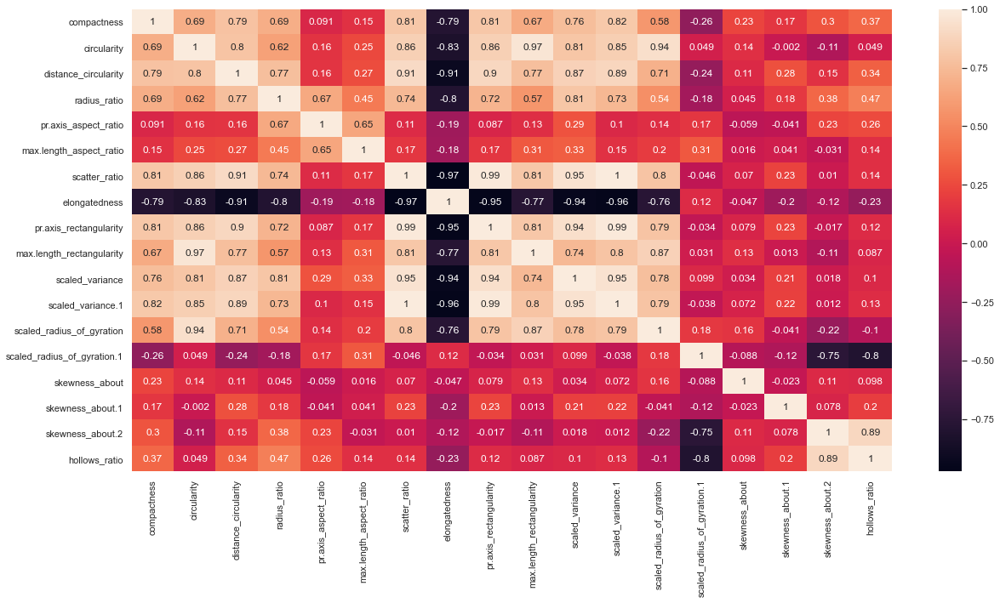

In [116]:
# plotting heat map for correlation of data
plt.figure(figsize=(20,10))
sns.heatmap(data=data.corr(),annot=True)

Observation : From above heat map we can see that the columns scaled_radius_of_gyration.1, skewness_about, skewness_about.1 have negative correlation with other attributes.Scatter-ratio and scaled_variance.1 columns are fully correlated.and some columns also have some correlation with attributes.

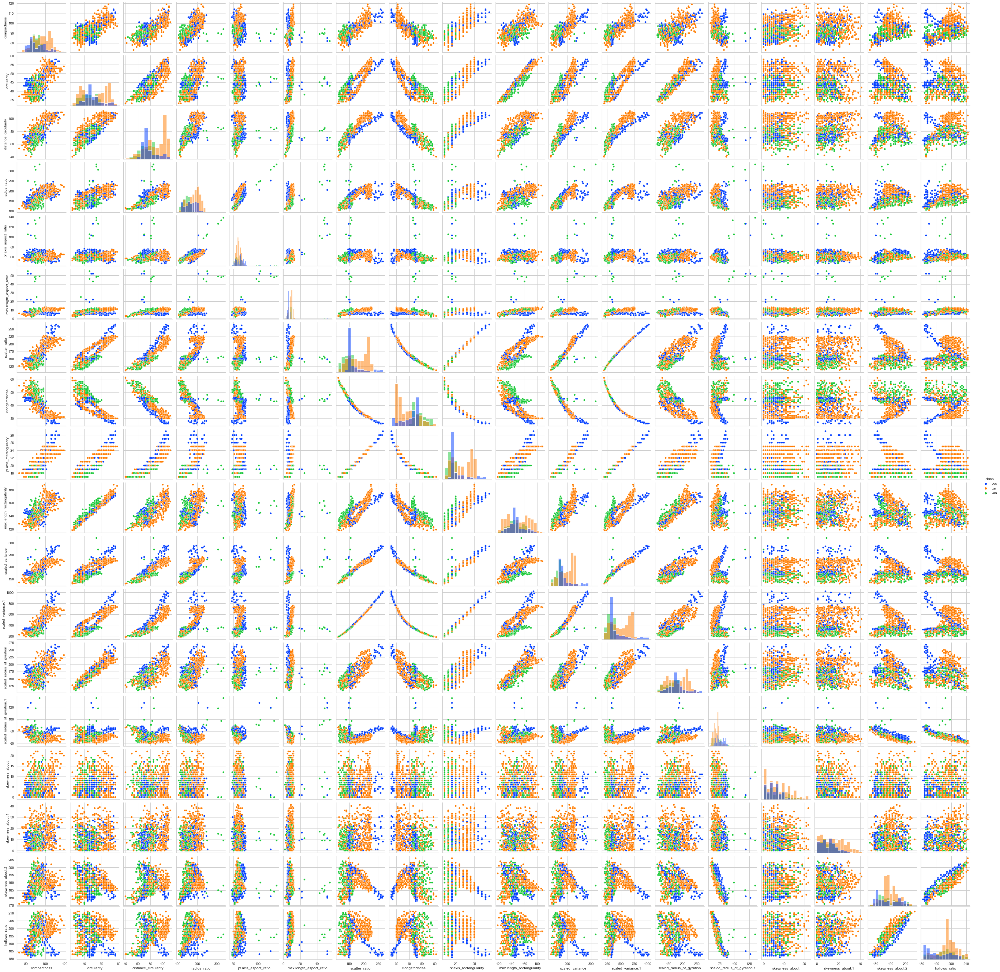

In [117]:
# plotting pairplot for the data
sns.pairplot(data,diag_kind='hist',hue='class',palette='bright')

### 3. Modeling

In [118]:
# split the predictors and target variables

X = data.drop('class',axis=1)
y = data['class'].cat.codes

In [119]:
# Apply zscore to the predictors
X_scaled = X.apply(zscore)

In [120]:
# perform train-test split

X_train,X_test,y_train,y_test = train_test_split(X_scaled,y,test_size=0.30,random_state=1)

In [121]:
# train svm model with all attributes

svm_model = SVC(gamma=0.25)
svm_model.fit(X_train,y_train)

svm_pred = svm_model.predict(X_test) 
print('Train Accuracy : ',svm_model.score(X_train,y_train))
print('Test Accuracy : ',svm_model.score(X_test,y_test))
print("\nclassification  Report For SVM:\n",classification_report(y_test,svm_pred))

Train Accuracy :  0.9876977152899824
Test Accuracy :  0.9508196721311475

classification  Report For SVM:
               precision    recall  f1-score   support

           0       1.00      0.92      0.96        53
           1       0.96      0.96      0.96       139
           2       0.88      0.96      0.92        52

    accuracy                           0.95       244
   macro avg       0.95      0.95      0.95       244
weighted avg       0.95      0.95      0.95       244



### 4. Dimensional reduction

In [122]:
# performing pca

pca = PCA(n_components=18)
pca.fit(X_train)

print('Eigen values : \n\n',pca.explained_variance_)
print('\nEigen Vectors : \n\n',pca.components_)

Eigen values : 

 [8.98411636e+00 2.95042006e+00 1.54601523e+00 1.13824634e+00
 9.19864889e-01 5.21364689e-01 3.80469949e-01 2.23716672e-01
 1.45275339e-01 9.06295142e-02 5.74554102e-02 4.06289583e-02
 3.43947798e-02 2.04148222e-02 1.61244501e-02 1.33121608e-02
 6.36963357e-03 3.54968096e-04]

Eigen Vectors : 

 [[ 2.77522566e-01  2.92229606e-01  2.99379865e-01  2.72919944e-01
   8.52375172e-02  9.31821051e-02  3.17832426e-01 -3.14985401e-01
   3.16219222e-01  2.74047912e-01  3.13643413e-01  3.16278291e-01
   2.72176655e-01 -2.03245628e-02  3.35276810e-02  3.76763518e-02
   3.36893604e-02  7.49338561e-02]
 [-1.07429251e-01  1.37838703e-01 -7.13941940e-02 -2.04123650e-01
  -1.48009492e-01  7.26830436e-03  4.34436074e-02  1.93612200e-02
   5.53926128e-02  1.27740550e-01  5.97386033e-02  4.69204145e-02
   2.12576568e-01  4.86580153e-01 -2.85801006e-02 -9.57465955e-02
  -5.36922322e-01 -5.41386129e-01]
 [-1.31820866e-01 -2.46294516e-02 -6.09334575e-02  2.82170711e-01
   6.54078700e-01  5.1

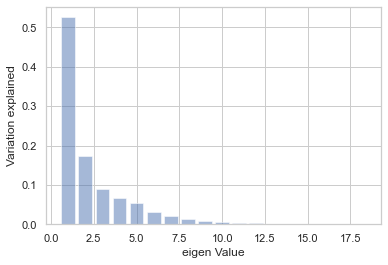

In [123]:
# plot bar plot for Explained_variance vs Eigen values
plt.bar(list(range(1,19)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

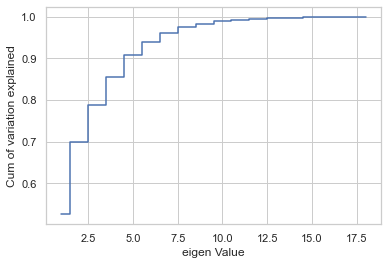

In [124]:
# plot step plot for Explained_variance vs Eigen values
plt.step(list(range(1,19)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

 Obseravtion: We can see from above plots that 10 components are enough for the data to get better results.So, We can make pca for 10 columns.

In [125]:
# perform pca for 10 columns
pca1 = PCA(n_components=10)
pca1.fit(X_train)
pca1.fit(X_test)
X_scaled = pca1.transform(X_scaled)

In [126]:
# train svm model
X_train,X_test,y_train,y_test = train_test_split(X_scaled,y,test_size=0.30,random_state=1)

svm_model1 = SVC(gamma=0.25)
svm_model1.fit(X_train,y_train)

svm_pred1 = svm_model1.predict(X_test) 
print('Train Accuracy : ',svm_model1.score(X_train,y_train))
print('Test Accuracy : ',svm_model1.score(X_test,y_test))
print("\nclassification  Report For SVM:\n",classification_report(y_test,svm_pred1))

Train Accuracy :  0.9859402460456942
Test Accuracy :  0.930327868852459

classification  Report For SVM:
               precision    recall  f1-score   support

           0       1.00      0.92      0.96        53
           1       0.96      0.93      0.95       139
           2       0.80      0.94      0.87        52

    accuracy                           0.93       244
   macro avg       0.92      0.93      0.92       244
weighted avg       0.94      0.93      0.93       244



### 5. Conclusion

* In this case We can see Both Accuracies(Model Accuracy before Applying pca and after applying pca) are Almost equal on Test data and We lost 1% Accuracy on train data.
* When we reduce the data to 10 columns then Accuracy is Equal to data with 18 columns.so, by reducing columns computation time will be low if we have more nof of rows.
* If we have more no of columns then pca will be much helped by increase the accuracy.

## --------------------------------------------------------------------------------------------------------------------------------------

# PART-IV

## DOMAIN: 
Sports management 
## CONTEXT: 
Company X is a sports management company for international cricket. 
## DATA DESCRIPTION: 
The data is collected belongs to batsman from IPL series conducted so far. Attribute Information: 
1. Runs: Runs score by the batsman
2. Ave: Average runs scored by the batsman per match
3. SR: strike rate of the batsman
4. Fours: number of boundary/four scored
5. Six: number of boundary/six scored
6. HF: number of half centuries scored so far

In [127]:
# import Sports data

player_data = pd.read_csv('Part4 - batting_bowling_ipl_bat.csv')

In [128]:
# top 5 rows in tha dataset
player_data.head()

,Name,Runs,Ave,SR,Fours,Sixes,HF
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [129]:
# shape of the data
player_data.shape

(180, 7)

In [130]:
# columns in the dataset
player_data.columns

Index(['Name', 'Runs', 'Ave', 'SR', 'Fours', 'Sixes', 'HF'], dtype='object')

In [131]:
# check for info of the dataset
player_data.info()

# Observation : we can see there are only 90 values in the data.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Name    90 non-null     object 
 1   Runs    90 non-null     float64
 2   Ave     90 non-null     float64
 3   SR      90 non-null     float64
 4   Fours   90 non-null     float64
 5   Sixes   90 non-null     float64
 6   HF      90 non-null     float64
dtypes: float64(6), object(1)
memory usage: 10.0+ KB


In [132]:
# check for null values
player_data.isna().sum()

# Observation : we can see there are 90 null values in the data.so, drop them

Name     90
Runs     90
Ave      90
SR       90
Fours    90
Sixes    90
HF       90
dtype: int64

In [133]:
# drop the null values
player_data.dropna(inplace=True)
player_data.reset_index(inplace=True)
player_data.drop('index',axis=1,inplace=True)

In [134]:
# describe the data
player_data.describe()

,Runs,Ave,SR,Fours,Sixes,HF
count,90.000000,90.000000,90.000000,90.000000,90.000000,90.000000
mean,219.933333,24.729889,119.164111,19.788889,7.577778,1.188889
std,156.253669,13.619215,23.656547,16.399845,8.001373,1.688656
min,2.000000,0.500000,18.180000,0.000000,0.000000,0.000000
25%,98.000000,14.665000,108.745000,6.250000,3.000000,0.000000
50%,196.500000,24.440000,120.135000,16.000000,6.000000,0.500000
75%,330.750000,32.195000,131.997500,28.000000,10.000000,2.000000
max,733.000000,81.330000,164.100000,73.000000,59.000000,9.000000


#### Visualization 

#### Bivariate Analysis

In [135]:
# define a function to plot hist plot, box plot and violin plot for numerical columns.

def uni_num_plot(data):
    if data.dtype == 'int64' or 'float64':
        fig,ax = plt.subplots(1,3,figsize = (20,5))
        sns.histplot(data,color='red',ax=ax[0])
        sns.boxplot(data,color='green',ax=ax[1])
        sns.violinplot(data,color='blue',ax=ax[2])
        ax[0].set_title(data.name)

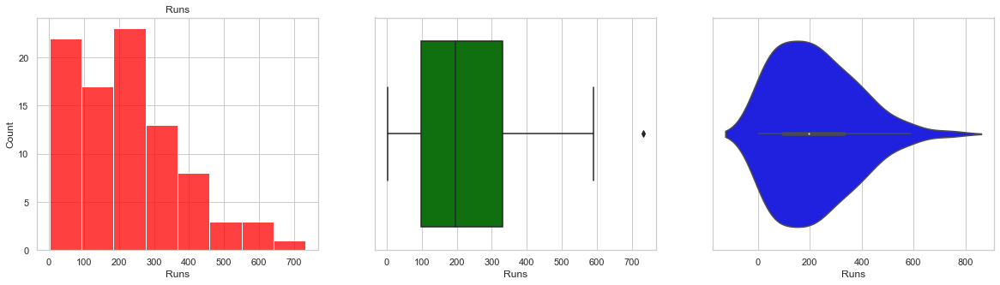

In [136]:
# plot hist plot, box plot and violin plot for Runs COlumn

uni_num_plot(player_data['Runs'])

Observation : From above plots we can see that there is one player Who scores more than 700 runs(i.e., 1 Outlier), data column is left Skewed distribution and 50% of players have the runs between 100-350.

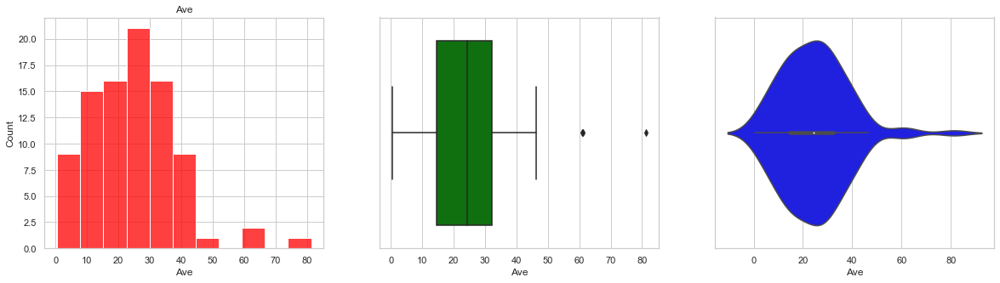

In [137]:
# plot hist plot, box plot and violin plot for Average COlumn

uni_num_plot(player_data['Ave'])

Observation : From above plots we can see that there are two players Whose Averages are more than 60 (i.e.,2 Outliers), data column is left Skewed distribution and 50% of players have the Average runs between 15-32.

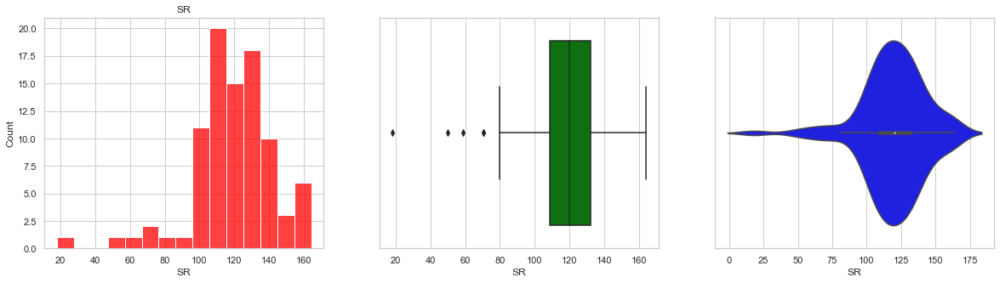

In [138]:
# plot hist plot, box plot and violin plot for Strike Rate COlumn

uni_num_plot(player_data['SR'])

Observation : From above plots we can see that there are 4 players Whose Strike rate is less than 80 (i.e.,4 Outliers), data column is Right Skewed distribution and 50% of players have the Strike rate between 110-130.

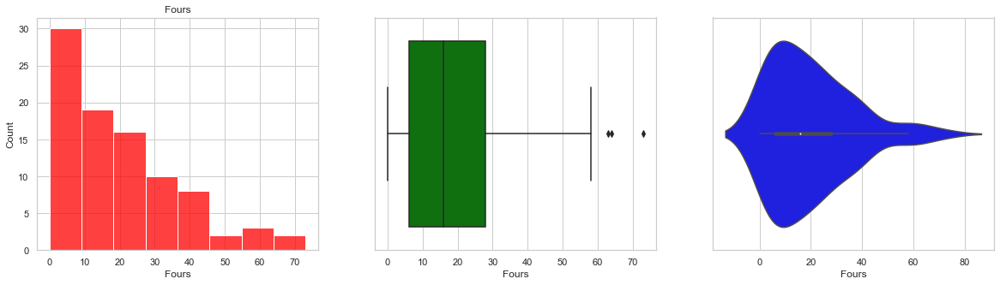

In [139]:
# plot hist plot, box plot and violin plot for Fours COlumn

uni_num_plot(player_data['Fours'])

Observation : From above plots we can see that there are 3 players Who scored more than 60 fours (i.e.,3 Outliers), data column is left Skewed distribution and 50% of players have scored the fours between 5-30.

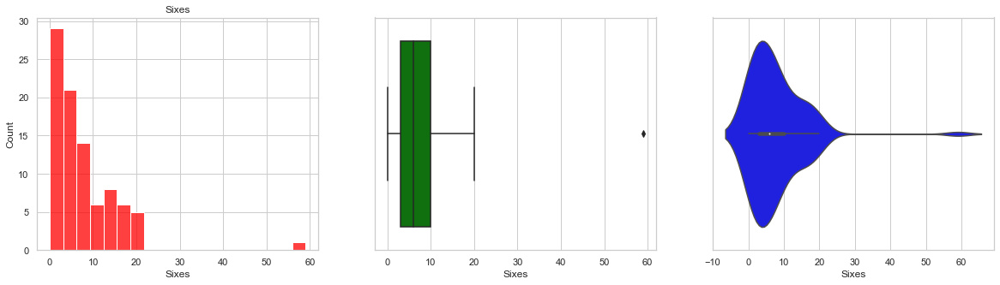

In [140]:
# plot hist plot, box plot and violin plot for Sixes COlumn

uni_num_plot(player_data['Sixes'])

Observation : From above plots we can see that there is one player Who scored more than 20 sixes (i.e.,1 Outlier), data column is left Skewed distribution and 50% of players have scored the sixes between 5-10.

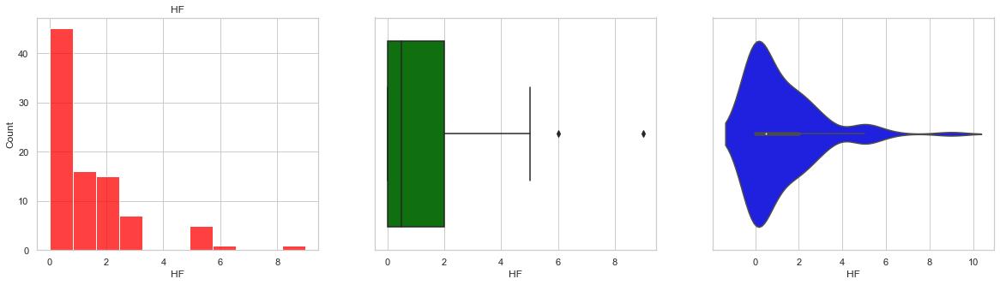

In [141]:
# plot hist plot, box plot and violin plot for Half Centuries COlumn

uni_num_plot(player_data['HF'])

Observation : From above plots we can see that there are 2 players Who scored more than 5 half centuries (i.e.,2 Outliers), data column is left Skewed distribution and 50% of players have scored half centuries between 0-2.

#### Multivariate Analysis

<AxesSubplot:xlabel='Runs', ylabel='Fours'>

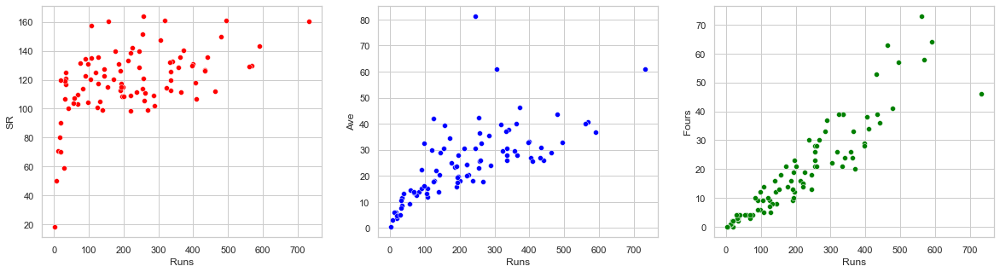

In [142]:
# plotting Scatter plot for runs vs strike rate
fig,ax = plt.subplots(1,3,figsize=(20,5))

sns.scatterplot(x=player_data['Runs'],y=player_data['SR'],color='red',ax=ax[0])
sns.scatterplot(x=player_data['Runs'],y=player_data['Ave'],color='blue',ax=ax[1])
sns.scatterplot(x=player_data['Runs'],y=player_data['Fours'],color='green',ax=ax[2])

Observation: from above plots we can see,
   * some players who scored less runs but they have high strike rate and high average.
   * A player who scored more than 700 runs and he scored less boundaries, some player who scored runs between 400-500 they scored high boundries.
   * When we see Runs vs Average plot A player who scored less runs but have average.

<AxesSubplot:xlabel='SR', ylabel='Sixes'>

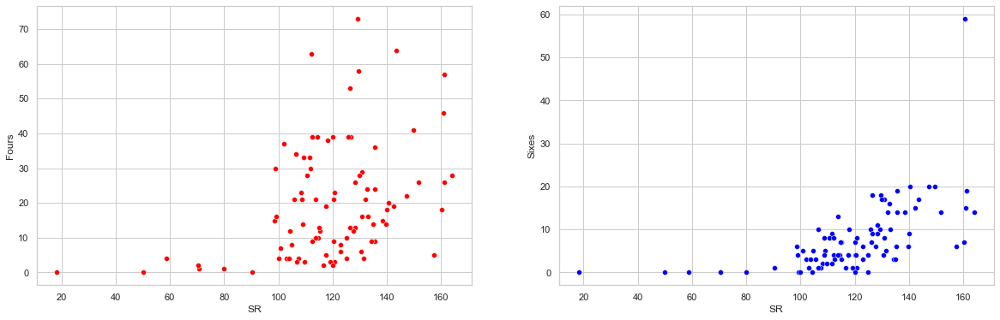

In [143]:
# plotting scatter plot for Sr vs Boundaries
fig,ax = plt.subplots(1,2,figsize=(20,6))
sns.scatterplot(x=player_data['SR'],y=player_data['Fours'],ax=ax[0],color='red')
sns.scatterplot(x=player_data['SR'],y=player_data['Sixes'],ax=ax[1],color='blue')

 Observation : From above plots we can see most of the boundaries are scored by players whose Strike rate is >100.So, We can say if SR is high then Boundary percentage is high for the players.

<AxesSubplot:xlabel='Name', ylabel='SR'>

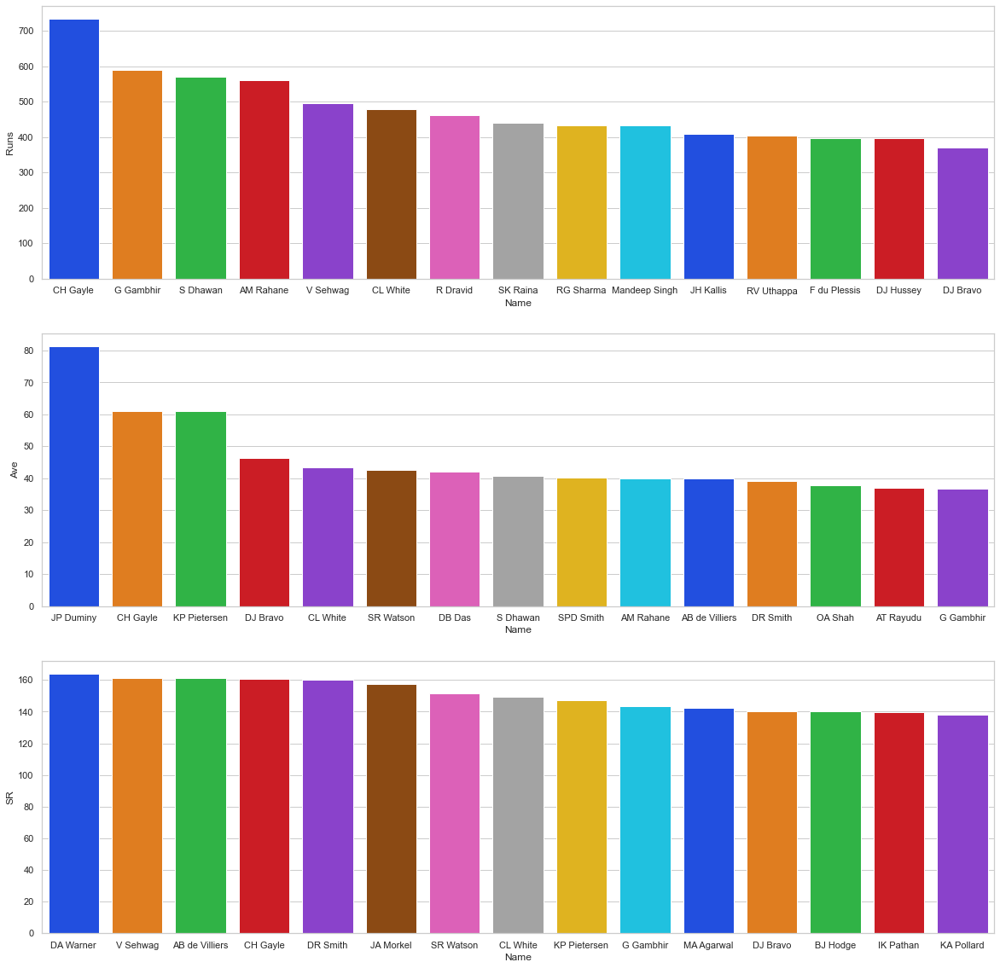

In [144]:
fig,ax = plt.subplots(3,1,figsize=(20,20))

# plotting bar plot for the players having high Runs
sns.barplot(x='Name',y='Runs',data=player_data.sort_values('Runs',ascending=False).head(15),palette='bright',ax=ax[0])

# plotting barplot for the players having high avg
sns.barplot(x='Name',y='Ave',data=player_data.sort_values('Ave',ascending=False).head(15),palette='bright',ax=ax[1])

# plotting barplot for the players having high Strike Rate
sns.barplot(x='Name',y='SR',data=player_data.sort_values('SR',ascending=False).head(15),palette='bright',ax=ax[2])

Observation : From Above plots,
* CH Gayle has Scored most runs(750) in the season With Avg of 60 ans SR of 160.
* G Gambir,S Dhawan,AM Rahane are also leading Run scores in the season by scoring above 500 runs.
* There are 5 players whose Strike rate is 160 and above (DA Warner,V Sehwag,AB de Villiers,CH Gayle,DR Smith).
* best Average in the Tournament is 80 by JP Duminy.C Gayle and Pietersen are also have good average.
* there are 13 players whose SR is above 140.

#### Multivariate Analysis

<AxesSubplot:>

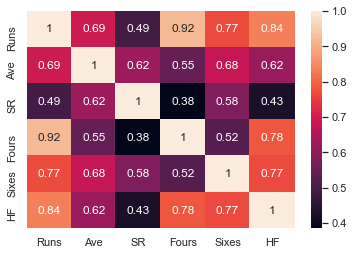

In [145]:
# heatmap for Correlation of data
sns.heatmap(player_data.corr(),annot=True)

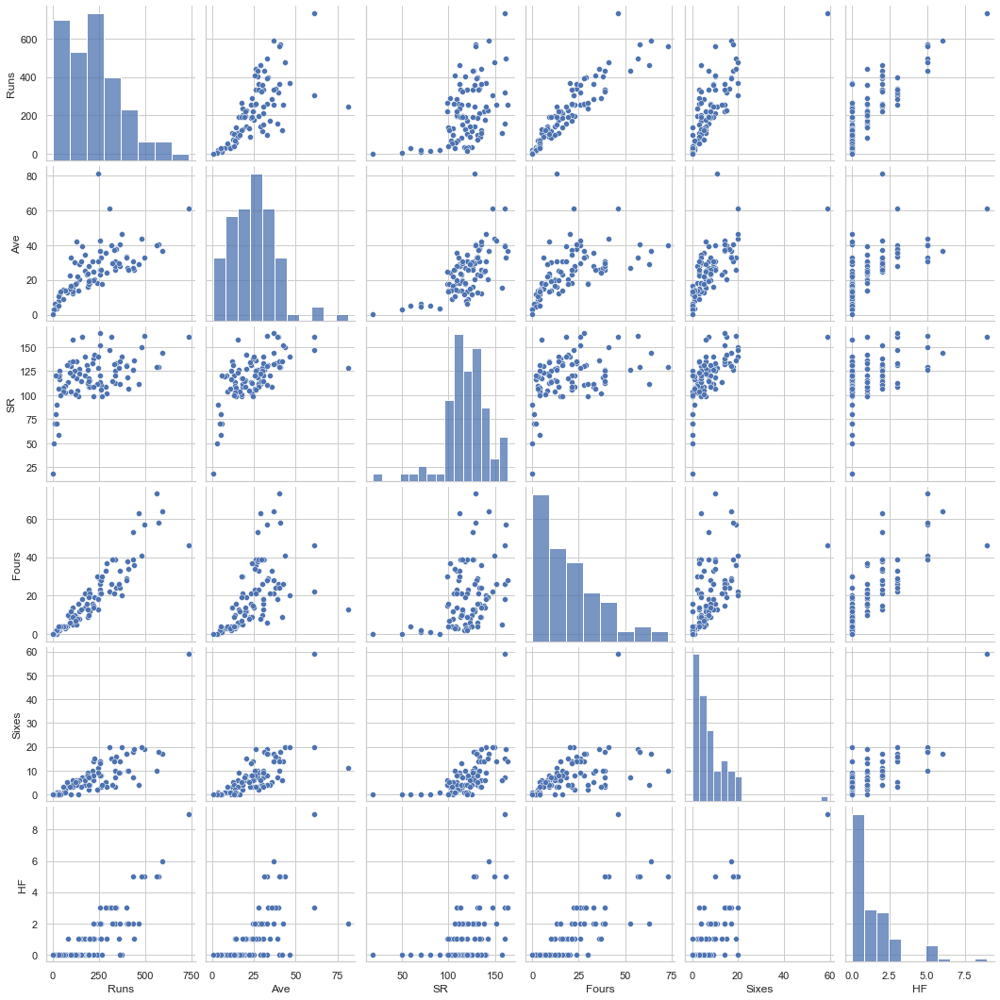

In [146]:
# pair plot for the data
sns.pairplot(player_data)

Observation : From above pirplot
* If a player scored more runs then scoring boundaries will be high.
* if SR is high then most of the runs was scored by boundaries.

#### Statistical Analysis

In [147]:
# Top 5 players Who scored most Runs
player_data.sort_values('Runs',ascending=False).Name.head(5)

0     CH Gayle
1    G Gambhir
4     S Dhawan
5    AM Rahane
2     V Sehwag
Name: Name, dtype: object

In [148]:
# Top 5 players Who have best Avg
player_data.sort_values('Ave',ascending=False).Name.head(5)

9        JP Duminy
0         CH Gayle
6     KP Pietersen
14        DJ Bravo
3         CL White
Name: Name, dtype: object

In [149]:
# Top 5 players Who have best Sr
player_data.sort_values('SR',ascending=False).Name.head(5)

10         DA Warner
2           V Sehwag
8     AB de Villiers
0           CH Gayle
20          DR Smith
Name: Name, dtype: object

In [150]:
# Top 5 players Who scored most Boundaries 4's
player_data.sort_values('Fours',ascending=False).Name.head(5)

5     AM Rahane
1     G Gambhir
19     R Dravid
4      S Dhawan
2      V Sehwag
Name: Name, dtype: object

In [151]:
# Top 5 players Who scored most Boundaries 6's
player_data.sort_values('Sixes',ascending=False).Name.head(5)

0         CH Gayle
6     KP Pietersen
14        DJ Bravo
3         CL White
16        SK Raina
Name: Name, dtype: object

In [152]:
# Top 5 players Who scored most Boundaries HF
player_data.sort_values('HF',ascending=False).Name.head(5)

0     CH Gayle
1    G Gambhir
2     V Sehwag
4     S Dhawan
5    AM Rahane
Name: Name, dtype: object

 Observation : best Players From the season are CH gayle,G Gambir,V Shewag,JP Duminy
 * If Company wants to take a decent batsmen player from Auction then I would prefer CH gayle.but competetion is very high for that player.
 * So, for Alternative i prefer G Gambhir because he is the 2nd leading Runscorer and have good strike rate.
 * i would also Prefer JP Duminy for Consistency because he has best Avg among other players in this season and also have good strike rate.
 * If company wants to take a hitter player from Auction then i would prefer Pietersen and CL White Becuse they have highest sixes and have good strike rate.
 * Sehwag is the player who ahve very good strike rate and top 5 run scorer in the season.

#### PCA

In [153]:
# performing pca
X = player_data.drop('Name',axis=1)
y = player_data['Name']
pca2 = PCA(n_components=6)
pca2.fit(X)

print('Eigen values : \n\n',pca2.explained_variance_)
print('\nEigen Vectors : \n\n',pca2.components_)

Eigen values : 

 [2.49110086e+04 4.50425375e+02 8.02565532e+01 4.58570713e+01
 8.12101336e+00 4.84074420e-01]

Eigen Vectors : 

 [[ 0.9899287   0.06024912  0.07542097  0.09545692  0.03912637  0.00894356]
 [ 0.08322604 -0.24821927 -0.95596245  0.08924133 -0.09813527 -0.00137132]
 [-0.00102213  0.8433851  -0.27978022 -0.39627291  0.23081674  0.01072246]
 [ 0.0763974  -0.47196052  0.00998473 -0.71281888  0.51302887  0.0027627 ]
 [-0.08473883  0.02276068 -0.0441803   0.55127004  0.79919313  0.2184973 ]
 [-0.0098139   0.01392969 -0.01090479  0.11782328  0.18345014 -0.97573278]]


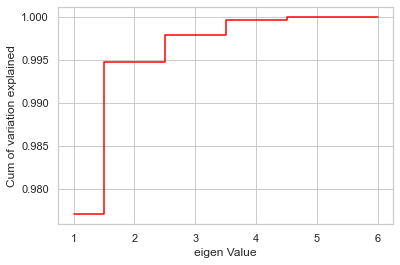

In [154]:
# plot step plot for Explained_variance vs Eigen values
plt.step(list(range(1,7)),np.cumsum(pca2.explained_variance_ratio_), where='mid',color='red')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

In [155]:
# We choose no of pcs as 3
pca2 = PCA(n_components=3)
pca2.fit(X)

eigen_values = pca2.explained_variance_
eigen_vectors = pca2.components_
print('Eigen values : \n\n',eigen_values)
print('\nEigen Vectors : \n\n',eigen_vectors)

Eigen values : 

 [24911.00856645   450.42537534    80.2565532 ]

Eigen Vectors : 

 [[ 0.9899287   0.06024912  0.07542097  0.09545692  0.03912637  0.00894356]
 [ 0.08322604 -0.24821927 -0.95596245  0.08924133 -0.09813527 -0.00137132]
 [-0.00102213  0.8433851  -0.27978022 -0.39627291  0.23081674  0.01072246]]


In [156]:
# calculating pc's scores
pc1_score,pc2_score,pc3_score = [0]*3
for i in range(0,len(eigen_values)):
    pc1_score = eigen_values[i]*eigen_vectors[0]+pc1_score
    pc2_score = eigen_values[i]*eigen_vectors[1]+pc2_score
    pc3_score = eigen_values[i]*eigen_vectors[2]+pc3_score

In [157]:
# add up all pc's scores
pc_score = pc1_score+pc2_score+pc3_score

In [158]:
pc_score

array([ 27276.86605589,  16674.86424333, -29520.54553086,  -5382.81714443,
         4371.08173533,    465.44814637])

In [159]:
# calculate score for data players
ranked_player_data = player_data
ranked_player_data['score'] = [0]*len(player_data)
column_names = player_data.columns.drop('Name')
for i in range(0,len(player_data)):
    for j in range(0,6):
        ranked_player_data['score'][i] = player_data[column_names[j]][i] + ranked_player_data['score'][i]

In [160]:
# top 10 players
ranked_player_data.sort_values('score',ascending=False).head(10)

,Name,Runs,Ave,SR,Fours,Sixes,HF,score
0,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0,1068
1,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0,856
4,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0,819
5,AM Rahane,560.0,40.00,129.33,73.0,10.0,5.0,817
2,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0,770
3,CL White,479.0,43.54,149.68,41.0,20.0,5.0,737
19,R Dravid,462.0,28.87,112.13,63.0,4.0,2.0,671
16,SK Raina,441.0,25.94,135.69,36.0,19.0,1.0,657
7,RG Sharma,433.0,30.92,126.60,39.0,18.0,5.0,651
18,Mandeep Singh,432.0,27.00,126.31,53.0,7.0,2.0,647


#### Conclusion : 
* Top 10 Batsmens are CH Gayle,G Gambhir,S Dhawan,AM Rahane,V Sehwag,CL White,R Dravid,SK Raina,RG Sharma,Mandeep Singh.
* If Company Wants to Buy a Player from Auction then above 10 players will be best to pick if they are in Auction.

## --------------------------------------------------------------------------------------------------------------------------------------

# PART-V

## 1. List down all possible dimensionality reduction techniques that can be implemented using python.

1. Missing Value Ratio
2. Low Variance Filter
3. High Correlation Filter
4. Random Forest
5. Backward Feature Elimination
6. Forward Feature Selection
7. Factor Analysis
8. Principal Component Analysis
9. Independent Component Analysis
10. Methods Based on Projections
11. t-Distributed Stochastic Neighbor Embedding (t-SNE)
12. UMAP

### 2. So far you have used dimensional reduction on numeric data. Is it possible to do the same on a multimedia data [images and video] and text data ? Please illustrate your findings using a simple implementation on python

(1200, 1200)

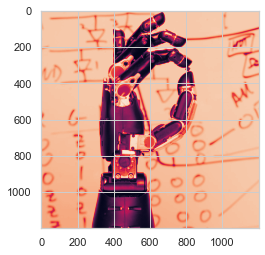

In [161]:
# read the image
image = cv2.imread('2100.jpg',0)
plt.imshow(image)
image.shape

In [162]:
# image -matrix
image

array([[228, 230, 231, ..., 234, 234, 234],
       [228, 229, 231, ..., 234, 234, 234],
       [227, 229, 230, ..., 234, 234, 234],
       ...,
       [212, 212, 212, ..., 225, 225, 226],
       [212, 212, 212, ..., 227, 227, 227],
       [212, 212, 212, ..., 228, 228, 228]], dtype=uint8)

In [163]:
# split data predictors vs Target variable
X = image[::,:-1]
y = image[::,-1:]

In [164]:
# perform train-test split and lr model
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=1)

# call linear regression model
lr = LinearRegression()
#fit the data
lr.fit(X_train,y_train)

# Accuracy 
Accuracy1 = lr.score(X_test,y_test)

In [165]:
# Apply pca to All columns
pca2 = PCA(n_components=1199)
pca2.fit(X)

PCA(n_components=1199)

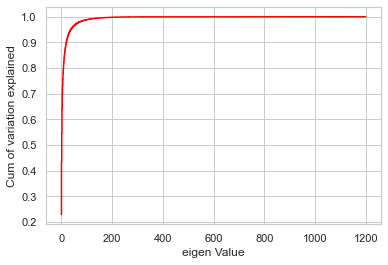

In [166]:
# plot step plot for Explained_variance vs Eigen values
plt.step(list(range(1,1200)),np.cumsum(pca2.explained_variance_ratio_), where='mid',color='red')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

In [167]:
# We choose no of pcs as 300
pca2 = PCA(n_components=300)
pca2.fit(X)
X = pca2.transform(X)

In [168]:
# perform lr model after apply pca
# perform train-test split and lr model
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=1)
lr = LinearRegression()
lr.fit(X_train,y_train)
Accuracy2 = lr.score(X_test,y_test)

In [169]:
print('Accuracy Before Apply PCA :',Accuracy1)
print('Accuracy After Apply PCA :',Accuracy2)

Accuracy Before Apply PCA : 0.9969166409244102
Accuracy After Apply PCA : 0.9814153212233454


#### Accuracy1 ~ Accuracy2

#### We can say dimesional reduction has worked on image.
#### Because We got 99% Accuracy if we use 1200 columns and after reduce the columns to 300 we got 98%.